In [2]:
import os
import argparse
import time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import torch
import torch.nn as nn        #for all Neural Network stuff
import torch.optim as optim  #for all optimizer stuff

In [3]:
#method argument not needed??
data_size = 2000 #number of points in linspace
batch_time = 20 #number of points in the interval after a random starting point
batch_size = 500 #number of intervals
niters = 2000 #number of iterations
test_freq = 2
viz = True
gpu = 1
adjoint = True

In [4]:
from torchdiffeq import odeint_adjoint as odeint

In [5]:
device = torch.device('cuda:' + str(gpu) if torch.cuda.is_available() else 'cpu')

In [6]:
#create linspace like usual
t = torch.linspace(0.0, 25.0, data_size)
g = 9.8
L1 = 1 
L2 = 0.75
m1 = 10
m2 = 10

In [7]:
def random():
    rand = 0
    while abs(rand) < 1 or abs(rand) > 3:
        rand = np.random.normal(0, 1, 1)[0]
    return rand

In [8]:
def getSlopesTorch(x,function):
    dim =  x.shape[0]**4
    slopeList = torch.zeros((dim,4))
    i = 0
    for f in x:
        for g in x:
            for h in x:
                for m in x:
                    #print(slope([],[f,g,h,m]))
                    slopeList[i] = function.forward([],torch.tensor([[f,g,h,m]]))
                    i += 1
    return slopeList

In [9]:
#lambda is a nn.Module like Linear, Conv2D etc,,
class Lambda(nn.Module):
    def forward(self,t,u):
        y = u[0]
        c, s = np.cos(y[0]-y[2]), np.sin(y[0]-y[2])
    
        de = torch.zeros_like(y)
        de[0] = y[1] #x1' = x2
        de[1] = (m2*g*np.sin(y[2])*c - m2*s*(L1*y[1]**2*c + L2*y[3]**2) - (m1 + m2)*g*np.sin(y[0]))/L1/(m1 + m2*s**2)
        de[2] = y[3] #y1' = y2
        de[3] = ((m1+m2)*(L1*y[1]**2*s - g*np.sin(y[2]) + g*np.sin(y[0])*c) + m2*L2*y[3]**2*s*c)/L2/(m1 + m2*s**2)

        return de

In [10]:
def get_batch():
    s = torch.from_numpy(np.random.choice(np.arange(data_size-batch_time, dtype=np.int64), batch_size, replace=False))
#s is a torch tensor from a numpy array. the array is a random choice array, a rand number from 0 to ds-bt is chosen bs times.
#s has batch_size elements and each was equally likely to be chosen
#why ds-bt? why not just data_size as a rance since we are chosing from the t linspace with ds many points?
#it does ds-bt so that when it chooses the next bt number of points we will never fall out of the index range if
#    ds=1000 and bt=10 then then if i start at 990, I will end up with 990-1000 and not over.
    batch_y0 = true_y[s] #(M, D) <- idk what this means
#b_y0 is made of the randomly selected data points (dep vals) from true_y solution
    batch_t = t[:batch_time] #(T)
#b_t is the values rank 0 to b_time from your linspace t; the linspace values being looked at
    batch_y = torch.stack([true_y[s+i] for i in range(batch_time)],dim=0)  # (T, M, D)
    return batch_y0, batch_t, batch_y


In [11]:
def makedirs(dirname):
    if not os.path.exists(dirname):
        os.makedirs(dirname)

In [12]:
def visualize(solution):
    
    #Draw
    theta1 = solution.numpy()[:,0,0]
    theta2 = solution.numpy()[:,0,2]
    x1_cor = 0
    y1_cor = 1

    x1 = L1 * np.sin(theta1) + x1_cor
    y1 = -L1 * np.cos(theta1) + y1_cor
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)

    plt.plot(x1,y1,'b',x2,y2,'g')

    plt.xlim(-2,2)
    plt.ylim(-1,3)
    plt.savefig('pngSlp/{:03d}'.format(itr))
    plt.show()

In [17]:
class ODEFunc(nn.Module): #create an ODE block as our neural network. usually multiple layers/modules
    
    def __init__(self):
        super(ODEFunc, self).__init__()
#self.net is the neural network layers one after the other L -> T -> L        
        self.net = nn.Sequential(    
            nn.Linear(4,50),
            nn.Tanh(),
            nn.Linear(50,100),
            nn.Tanh(),
            nn.Linear(100,50),
            nn.Tanh(),
            nn.Linear(50,4),
        )
        
        for m in self.net.modules():
            if isinstance(m,nn.Linear): #checks in the module m in self.net is an instance of the nn.Linear class
                nn.init.normal_(m.weight, mean=0, std=0.1) #for the Linear modules make all the weights randn with std 0.1
                nn.init.constant_(m.bias, val=0) #for the Linear modules make all the bias vector values 0
    
    def forward(self, t, y):
        return self.net(y) #essentially Lambda.forward(args) without the true_A >>>which is TBD<<<

In [14]:
class RunningAverageMeter(object): #Computes and stores the average and current value
    def __init__(self, momentum=0.99): #new object of this class will have mom of 0.99 and a reset val and avg
        self.momentum = momentum
        self.reset()
    def reset(self):                   #reset function called to set val and avg to None and 0 respectively
        self.val = None
        self.avg = 0
    def update(self, val):             #update is called externally to update the avg based on val
        if self.val is None:
            self.avg = val
        else:
            self.avg = (self.avg * self.momentum) + (val * (1 - self.momentum)) #reminds me of output error at L

Iteration 0001 | Total Loss 25.939489
Iteration 0002 | Total Loss 24.630371


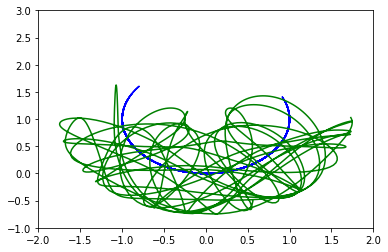

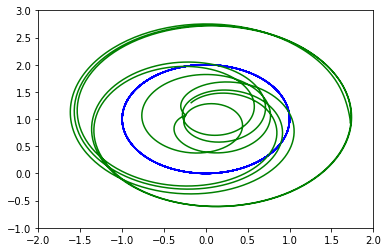

Iteration 0003 | Total Loss 15.110731
Iteration 0004 | Total Loss 11.013517


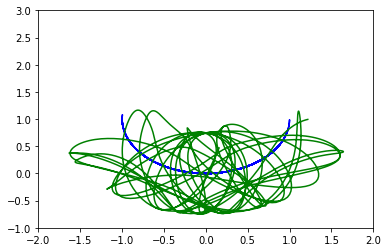

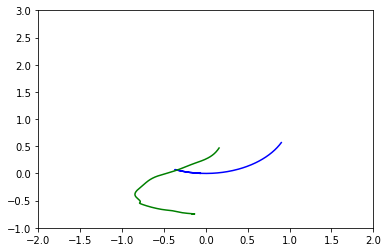

Iteration 0005 | Total Loss 18.583632
Iteration 0006 | Total Loss 14.550477


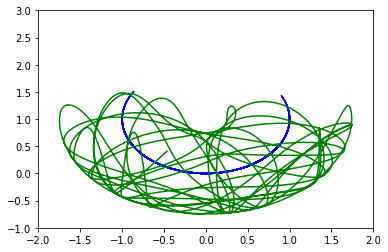

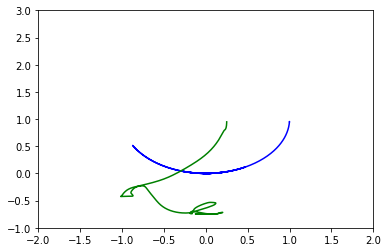

Iteration 0007 | Total Loss 11.002513
Iteration 0008 | Total Loss 7.365171


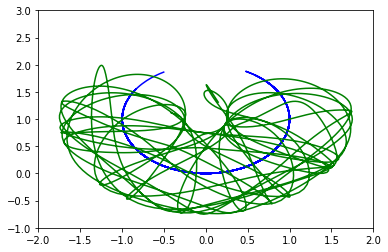

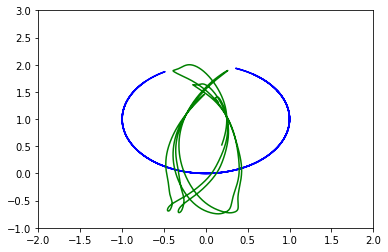

Iteration 0009 | Total Loss 6.311599
Iteration 0010 | Total Loss 5.937060


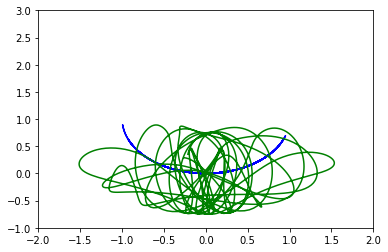

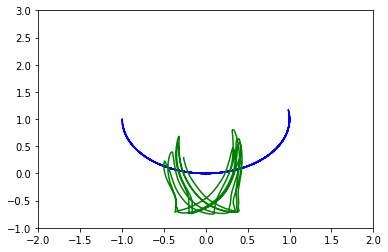

Iteration 0011 | Total Loss 5.821378
Iteration 0012 | Total Loss 6.013483


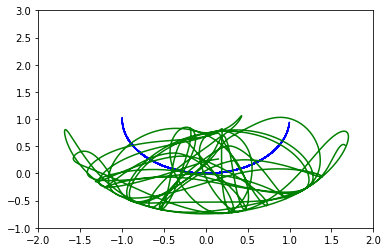

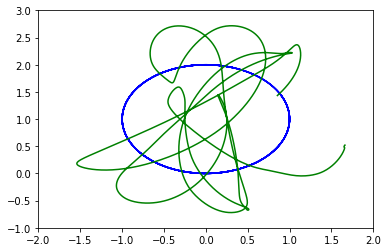

Iteration 0013 | Total Loss 6.547085
Iteration 0014 | Total Loss 7.264006


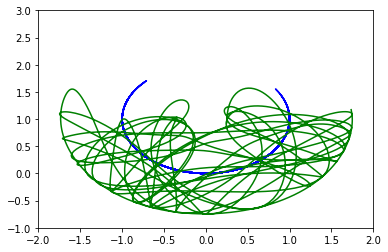

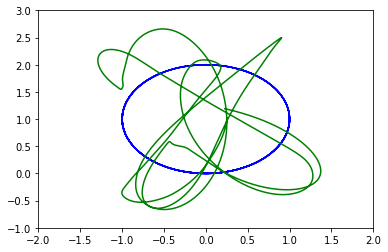

Iteration 0015 | Total Loss 6.723308
Iteration 0016 | Total Loss 6.518257


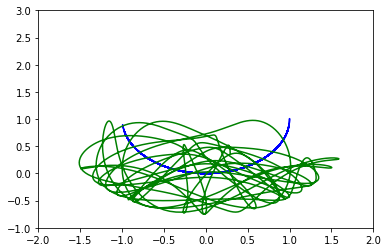

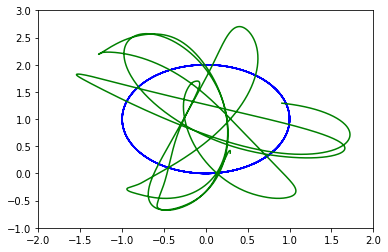

Iteration 0017 | Total Loss 5.532059
Iteration 0018 | Total Loss 5.117809


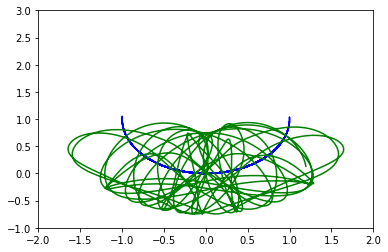

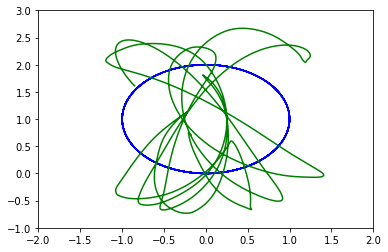

Iteration 0019 | Total Loss 4.846845
Iteration 0020 | Total Loss 4.740424


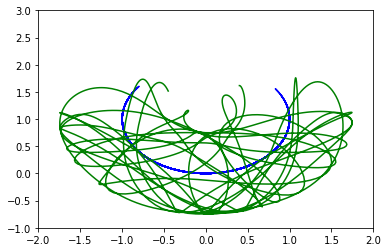

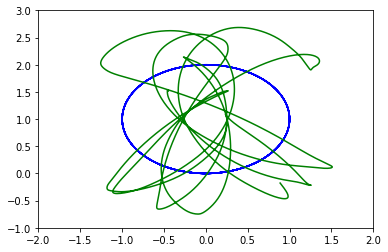

Iteration 0021 | Total Loss 4.788105
Iteration 0022 | Total Loss 5.177284


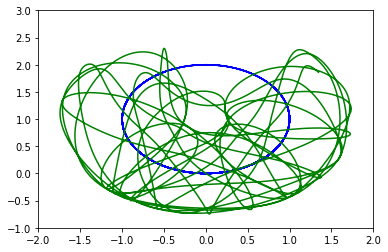

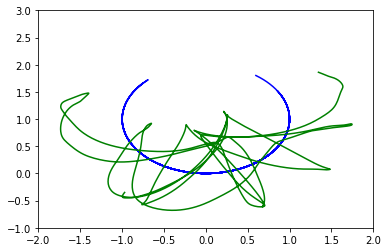

Iteration 0023 | Total Loss 5.169586
Iteration 0024 | Total Loss 5.559976


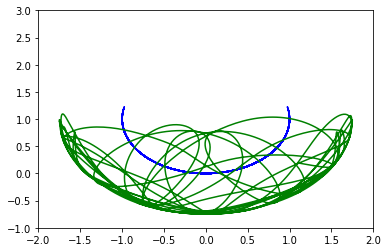

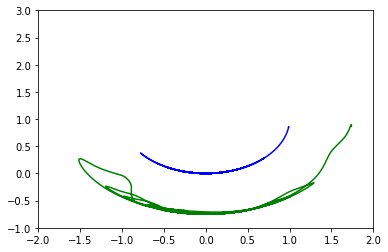

Iteration 0025 | Total Loss 4.771239
Iteration 0026 | Total Loss 4.643298


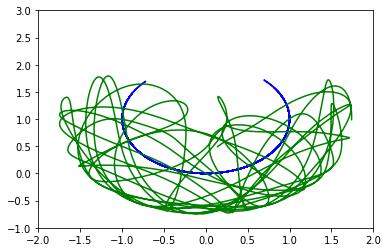

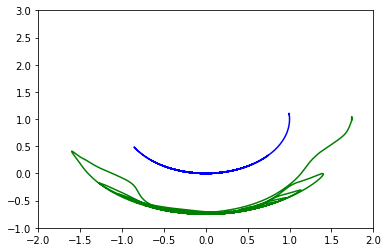

Iteration 0027 | Total Loss 4.312422
Iteration 0028 | Total Loss 4.373360


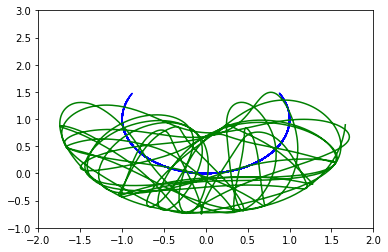

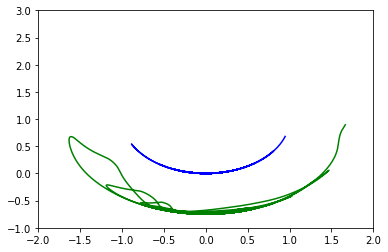

Iteration 0029 | Total Loss 4.468631
Iteration 0030 | Total Loss 4.643275


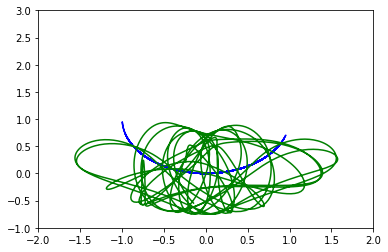

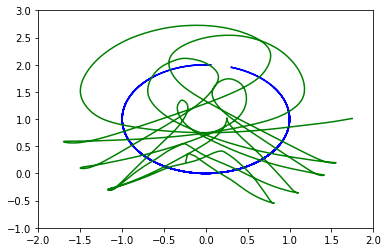

Iteration 0031 | Total Loss 4.206064
Iteration 0032 | Total Loss 4.294608


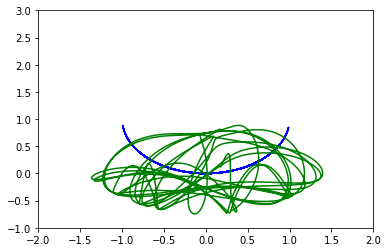

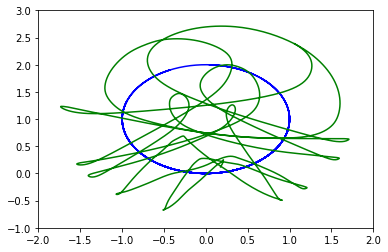

Iteration 0033 | Total Loss 3.995207
Iteration 0034 | Total Loss 4.293962


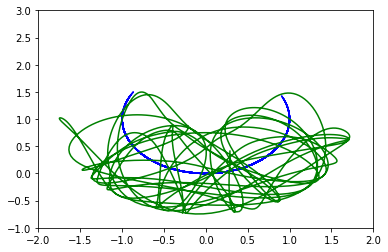

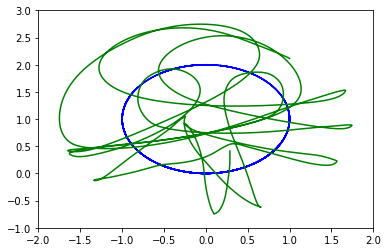

Iteration 0035 | Total Loss 4.200776
Iteration 0036 | Total Loss 4.258205


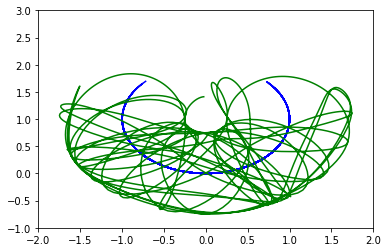

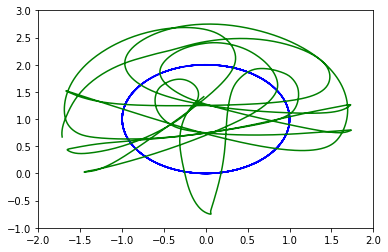

Iteration 0037 | Total Loss 3.675894
Iteration 0038 | Total Loss 3.675776


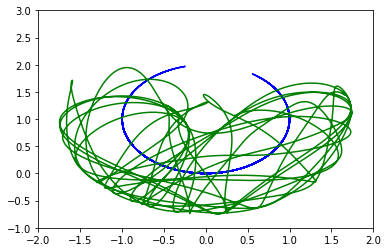

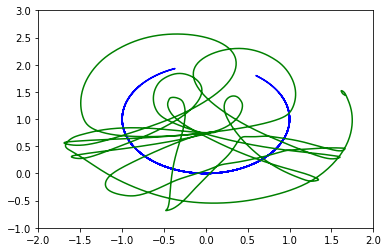

Iteration 0039 | Total Loss 3.619764
Iteration 0040 | Total Loss 3.922858


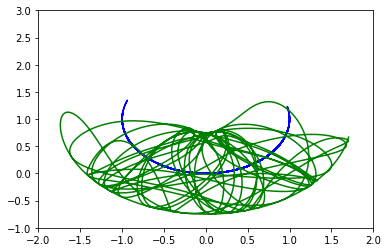

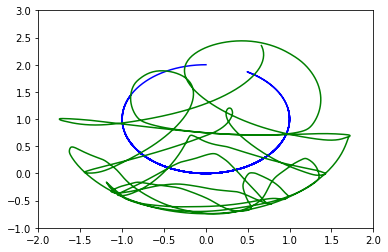

Iteration 0041 | Total Loss 3.816252
Iteration 0042 | Total Loss 4.090463


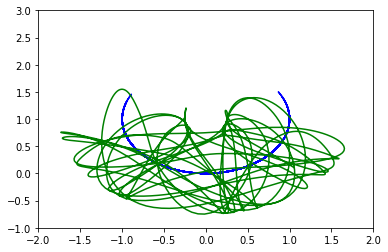

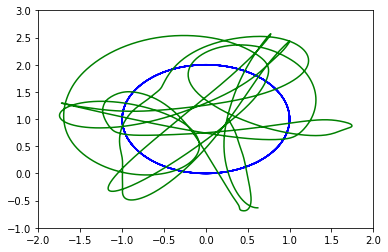

Iteration 0043 | Total Loss 3.673755
Iteration 0044 | Total Loss 3.906868


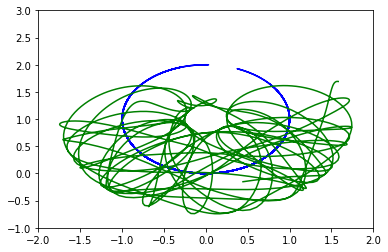

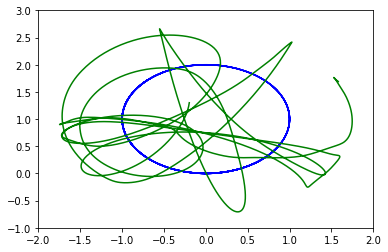

Iteration 0045 | Total Loss 3.831744
Iteration 0046 | Total Loss 3.936315


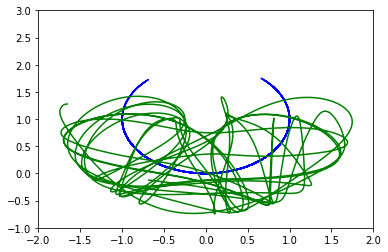

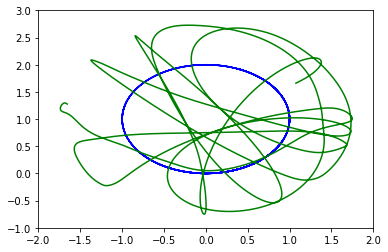

Iteration 0047 | Total Loss 3.597676
Iteration 0048 | Total Loss 3.685340


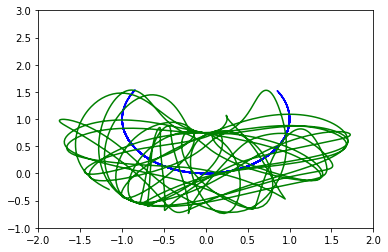

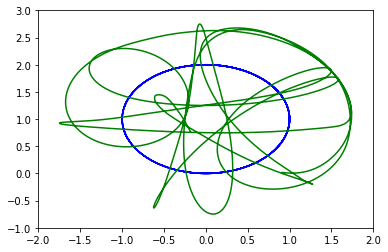

Iteration 0049 | Total Loss 3.484456
Iteration 0050 | Total Loss 3.583698


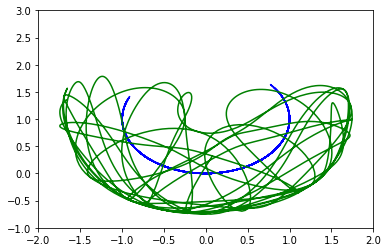

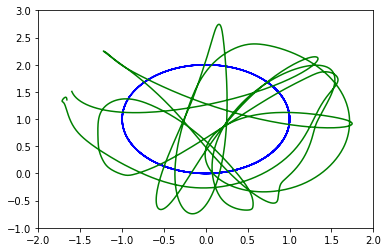

Iteration 0051 | Total Loss 3.284475
Iteration 0052 | Total Loss 3.500328


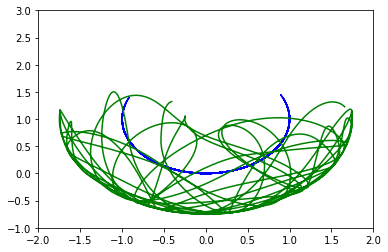

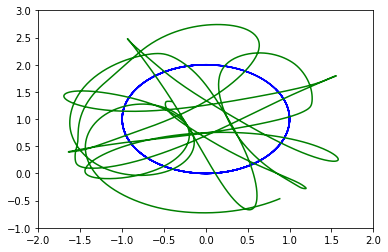

Iteration 0053 | Total Loss 3.195545
Iteration 0054 | Total Loss 3.463421


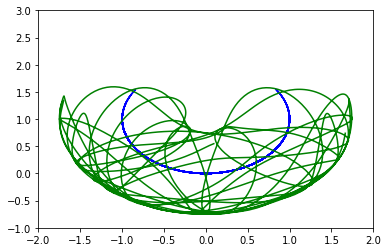

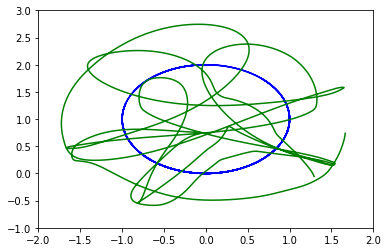

Iteration 0055 | Total Loss 3.082021
Iteration 0056 | Total Loss 3.297032


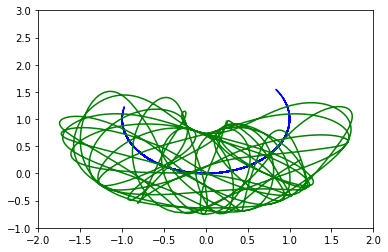

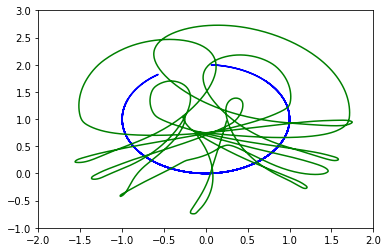

Iteration 0057 | Total Loss 3.012901
Iteration 0058 | Total Loss 3.230683


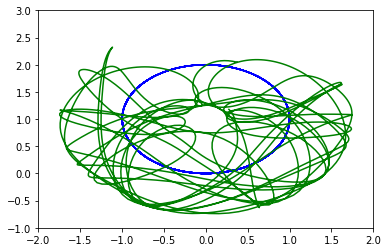

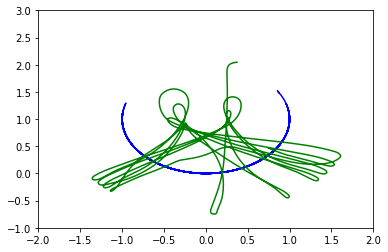

Iteration 0059 | Total Loss 2.982244
Iteration 0060 | Total Loss 3.208115


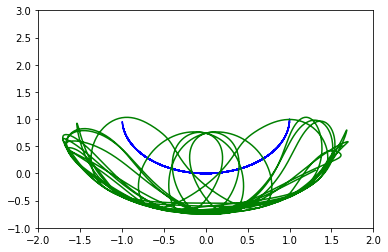

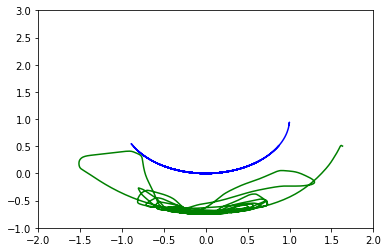

Iteration 0061 | Total Loss 2.939850
Iteration 0062 | Total Loss 3.174849


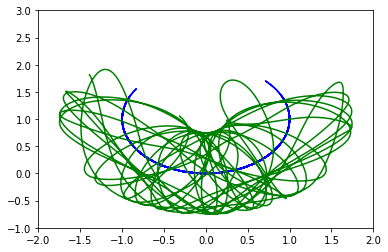

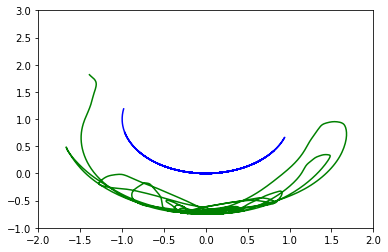

Iteration 0063 | Total Loss 2.888442
Iteration 0064 | Total Loss 3.126630


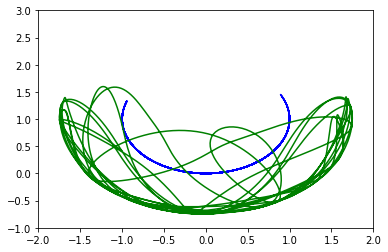

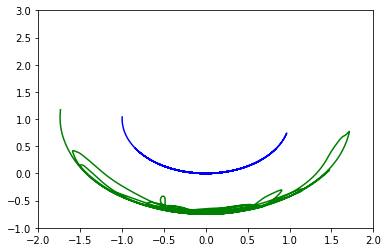

Iteration 0065 | Total Loss 2.868240
Iteration 0066 | Total Loss 3.140836


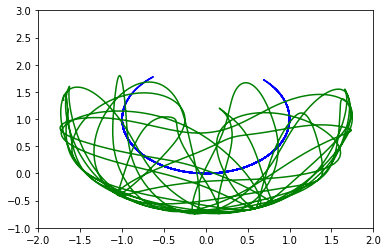

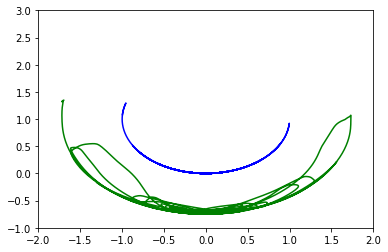

Iteration 0067 | Total Loss 2.928486
Iteration 0068 | Total Loss 3.106955


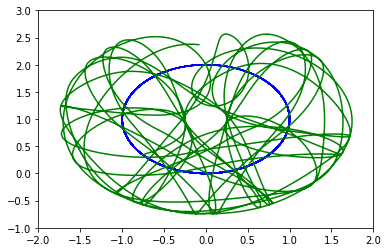

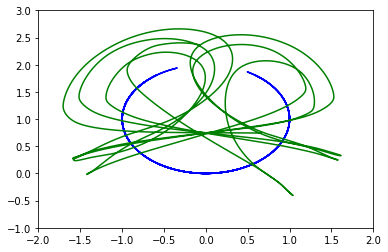

Iteration 0069 | Total Loss 2.796928
Iteration 0070 | Total Loss 2.921801


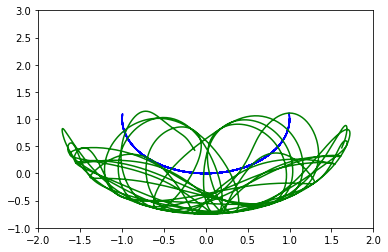

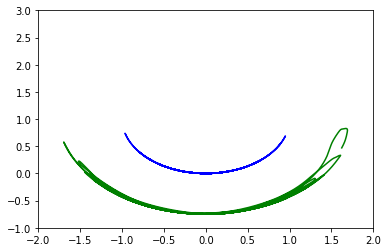

Iteration 0071 | Total Loss 2.634541
Iteration 0072 | Total Loss 2.849466


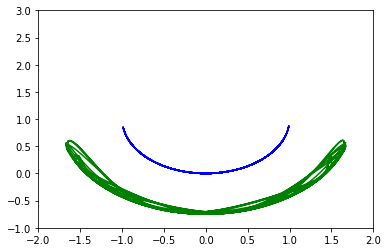

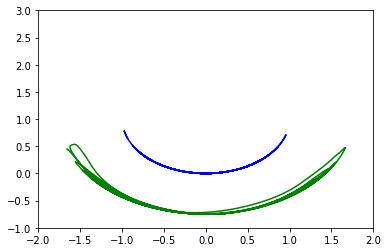

Iteration 0073 | Total Loss 2.613112
Iteration 0074 | Total Loss 2.888135


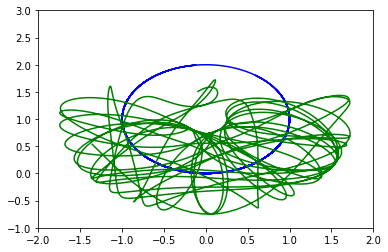

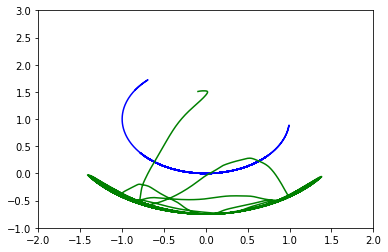

Iteration 0075 | Total Loss 2.629305
Iteration 0076 | Total Loss 2.892717


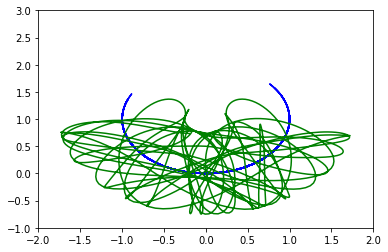

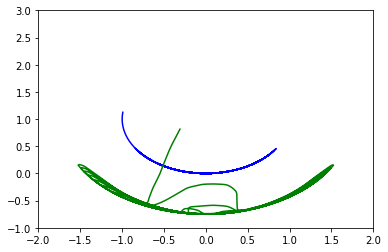

Iteration 0077 | Total Loss 2.594823
Iteration 0078 | Total Loss 2.789498


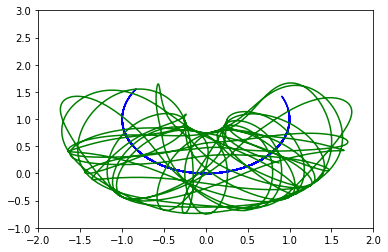

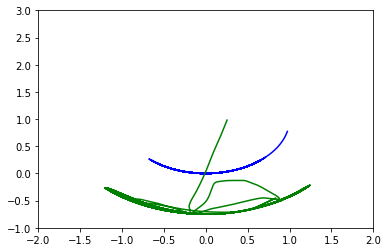

Iteration 0079 | Total Loss 2.527678
Iteration 0080 | Total Loss 2.658891


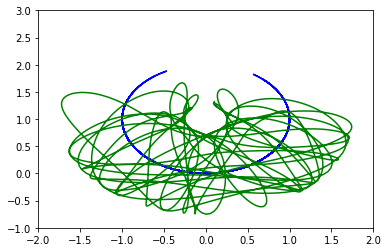

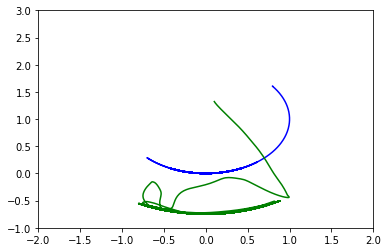

Iteration 0081 | Total Loss 2.443849
Iteration 0082 | Total Loss 2.535783


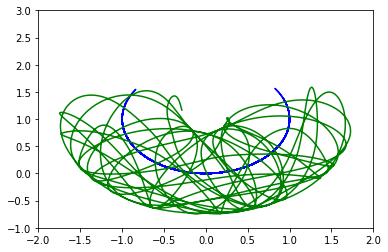

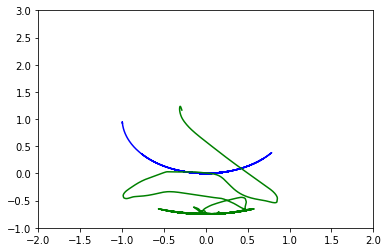

Iteration 0083 | Total Loss 2.328035
Iteration 0084 | Total Loss 2.482740


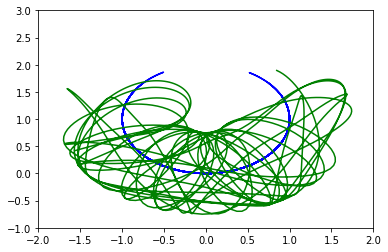

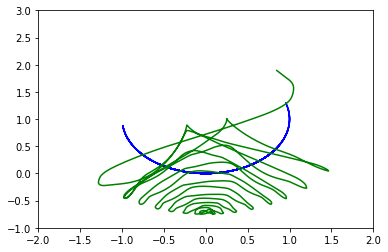

Iteration 0085 | Total Loss 2.290794
Iteration 0086 | Total Loss 2.518557


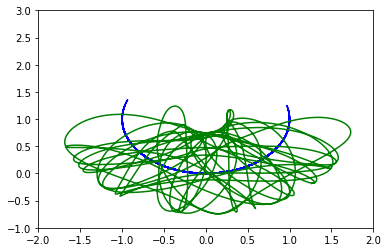

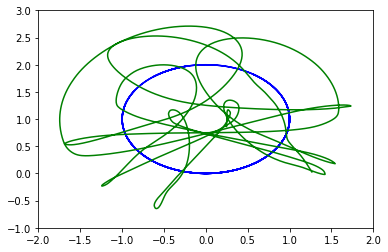

Iteration 0087 | Total Loss 2.323959
Iteration 0088 | Total Loss 2.552614


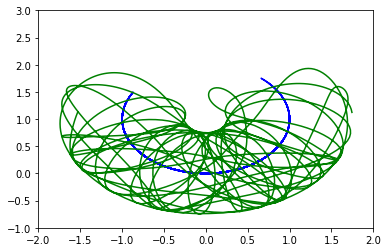

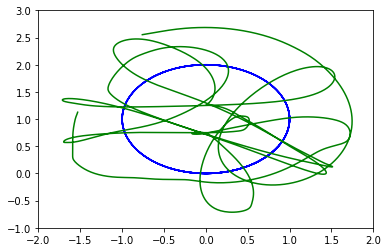

Iteration 0089 | Total Loss 2.374809
Iteration 0090 | Total Loss 2.542554


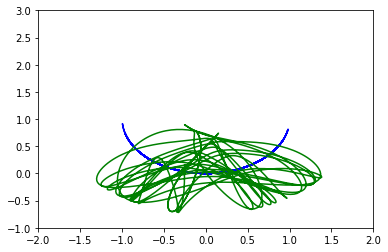

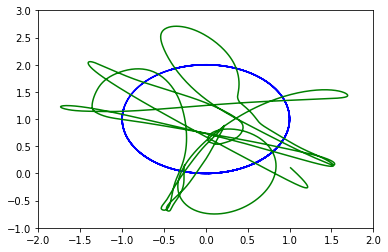

Iteration 0091 | Total Loss 2.406558
Iteration 0092 | Total Loss 2.494095


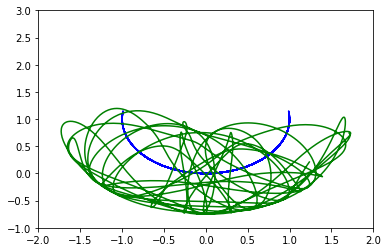

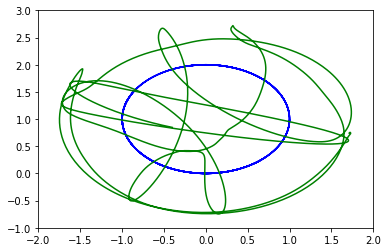

Iteration 0093 | Total Loss 2.323697
Iteration 0094 | Total Loss 2.413902


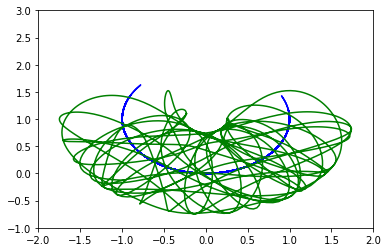

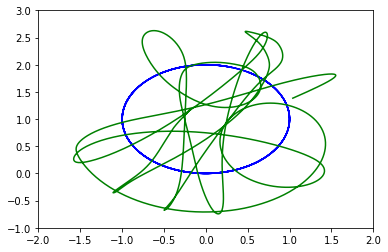

Iteration 0095 | Total Loss 2.247127
Iteration 0096 | Total Loss 2.395518


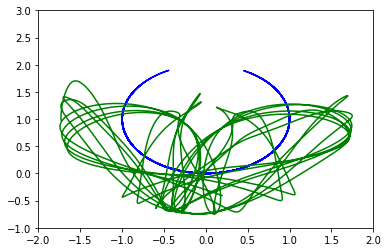

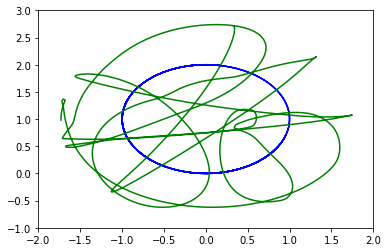

Iteration 0097 | Total Loss 2.185345
Iteration 0098 | Total Loss 2.390365


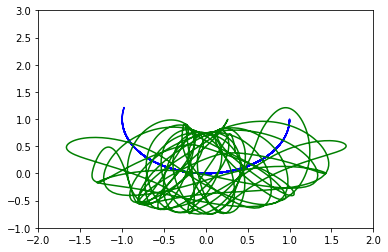

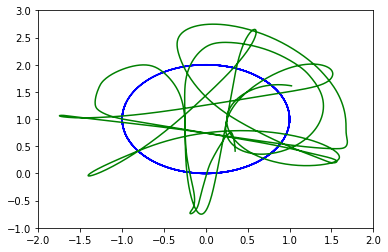

Iteration 0099 | Total Loss 2.155998
Iteration 0100 | Total Loss 2.414576


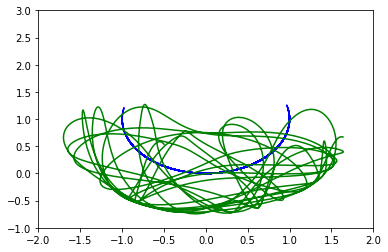

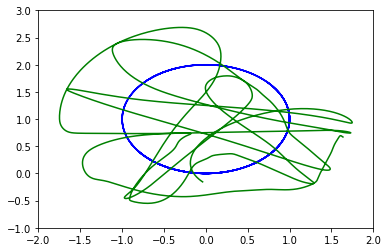

Iteration 0101 | Total Loss 2.201423
Iteration 0102 | Total Loss 2.449779


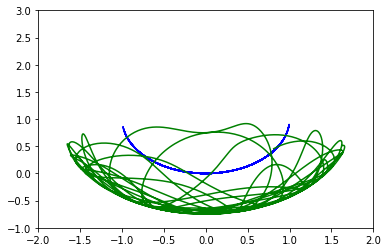

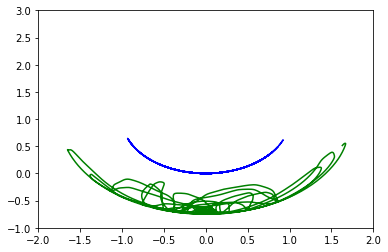

Iteration 0103 | Total Loss 2.221549
Iteration 0104 | Total Loss 2.368212


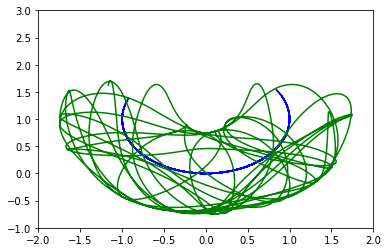

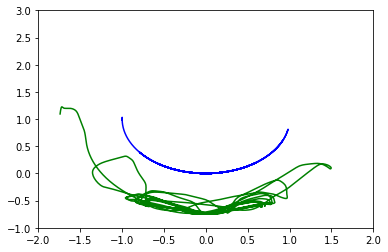

Iteration 0105 | Total Loss 2.114115
Iteration 0106 | Total Loss 2.237183


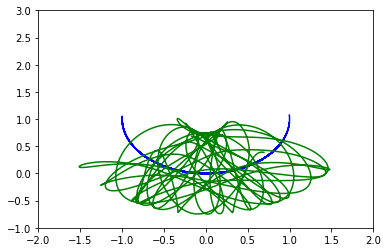

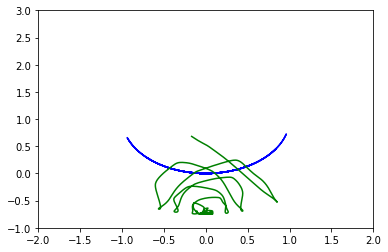

Iteration 0107 | Total Loss 2.012843
Iteration 0108 | Total Loss 2.199759


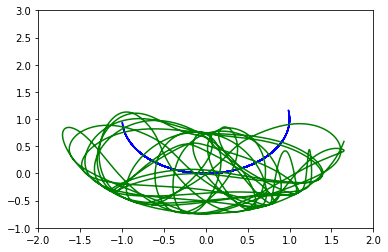

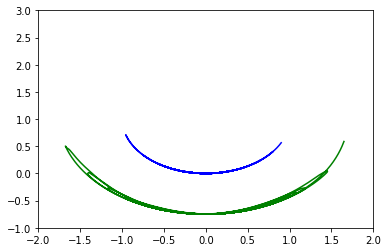

Iteration 0109 | Total Loss 1.983328
Iteration 0110 | Total Loss 2.203934


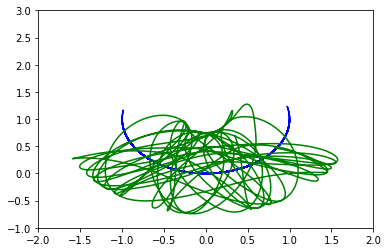

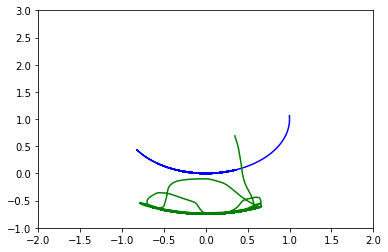

Iteration 0111 | Total Loss 1.980570
Iteration 0112 | Total Loss 2.198640


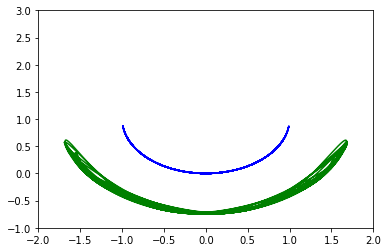

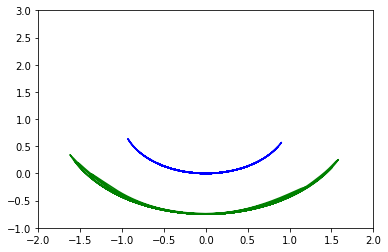

Iteration 0113 | Total Loss 1.994873
Iteration 0114 | Total Loss 2.207028


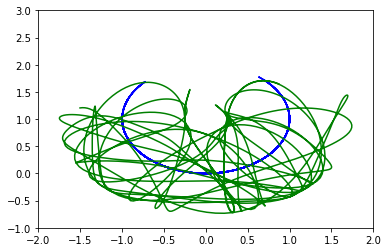

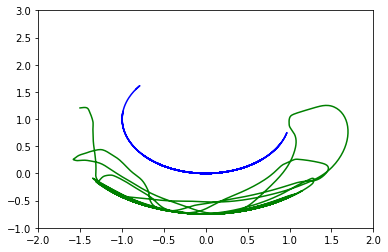

Iteration 0115 | Total Loss 1.981281
Iteration 0116 | Total Loss 2.155896


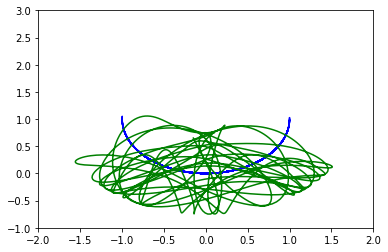

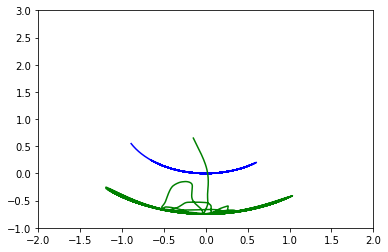

Iteration 0117 | Total Loss 1.907480
Iteration 0118 | Total Loss 2.092909


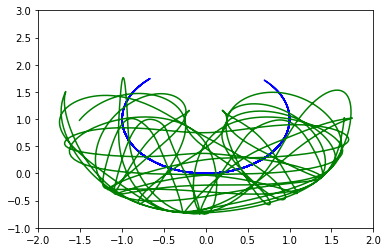

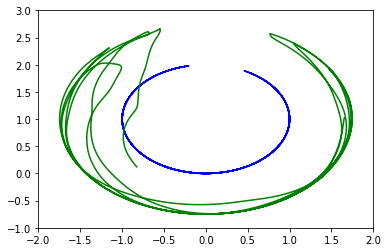

Iteration 0119 | Total Loss 1.878699
Iteration 0120 | Total Loss 2.152217


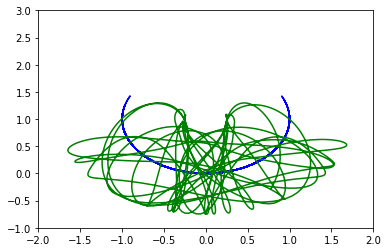

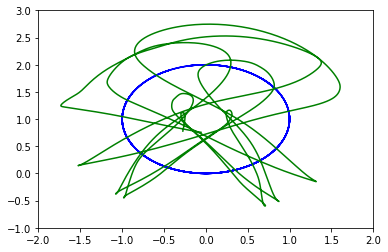

Iteration 0121 | Total Loss 1.964360
Iteration 0122 | Total Loss 2.283667


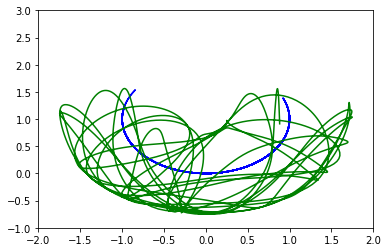

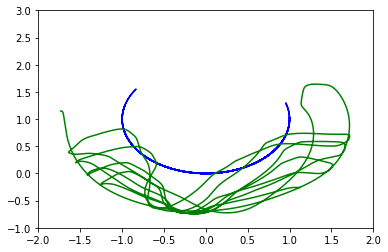

Iteration 0123 | Total Loss 2.065659
Iteration 0124 | Total Loss 2.235540


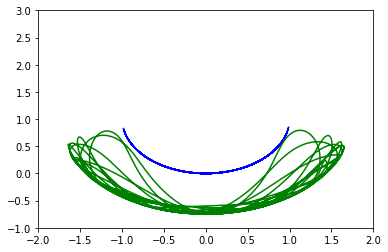

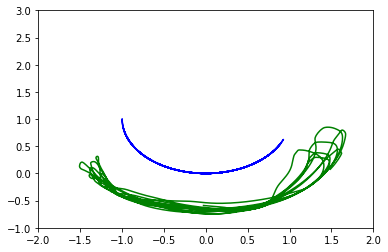

Iteration 0125 | Total Loss 1.959750
Iteration 0126 | Total Loss 2.051491


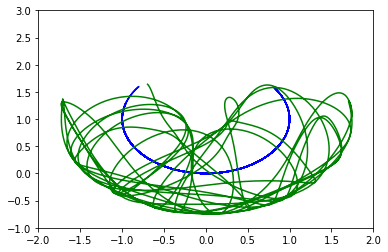

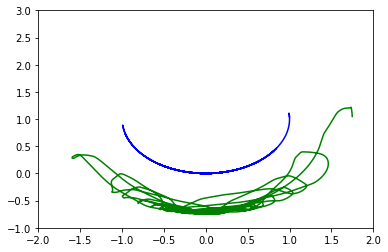

Iteration 0127 | Total Loss 1.817384
Iteration 0128 | Total Loss 1.971680


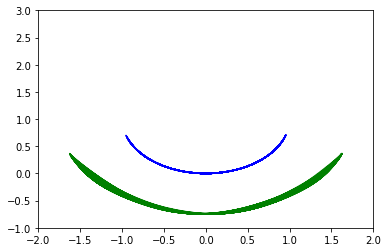

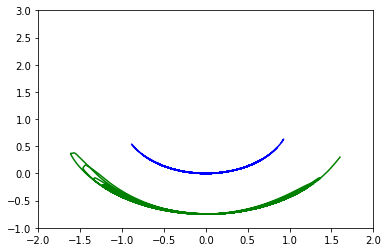

Iteration 0129 | Total Loss 1.747305
Iteration 0130 | Total Loss 1.937690


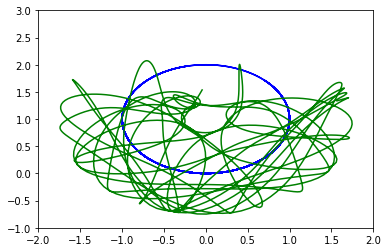

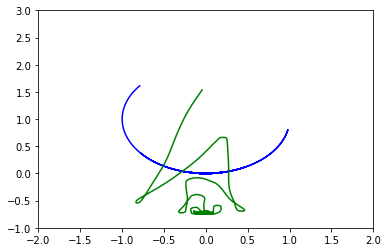

Iteration 0131 | Total Loss 1.691571
Iteration 0132 | Total Loss 1.875372


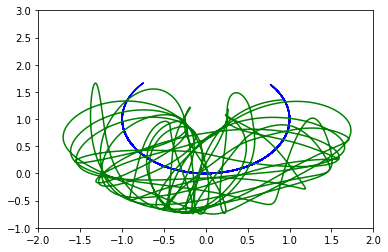

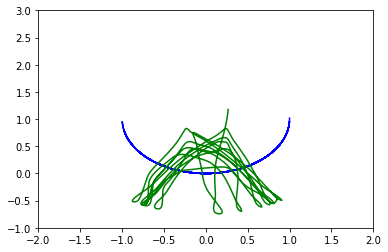

Iteration 0133 | Total Loss 1.634948
Iteration 0134 | Total Loss 1.821458


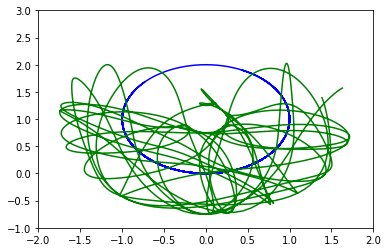

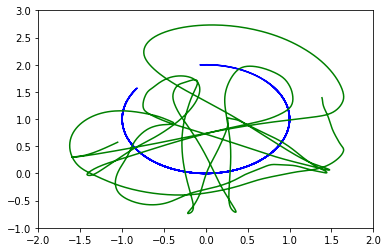

Iteration 0135 | Total Loss 1.605352
Iteration 0136 | Total Loss 1.816512


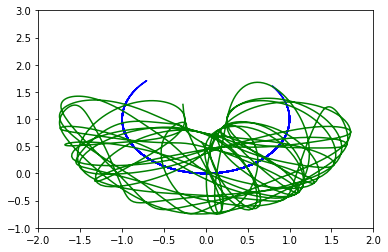

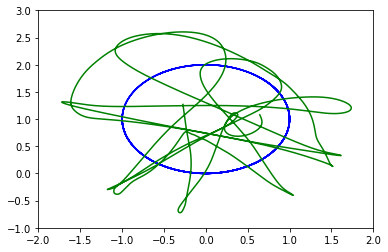

Iteration 0137 | Total Loss 1.611167
Iteration 0138 | Total Loss 1.845923


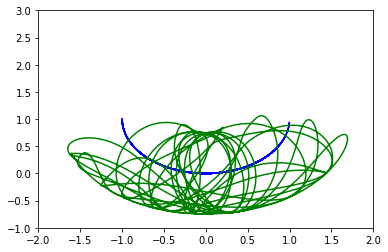

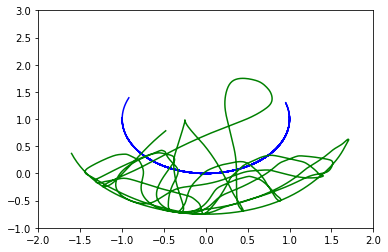

Iteration 0139 | Total Loss 1.642585
Iteration 0140 | Total Loss 1.885795


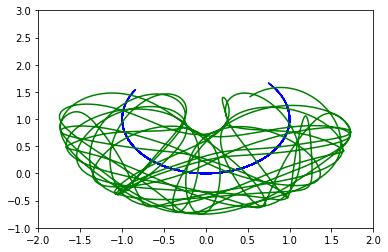

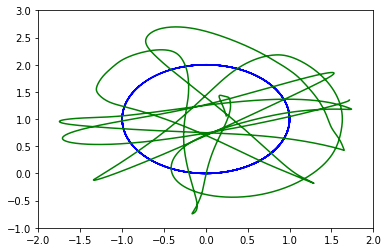

Iteration 0141 | Total Loss 1.695673
Iteration 0142 | Total Loss 1.934106


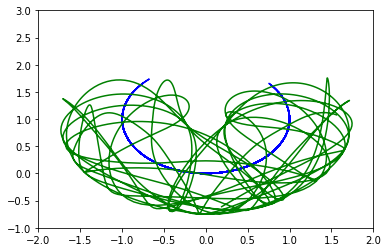

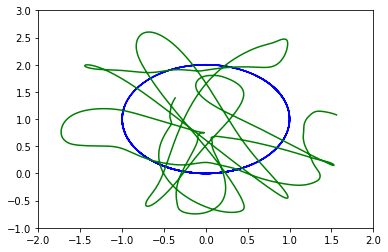

Iteration 0143 | Total Loss 1.759022
Iteration 0144 | Total Loss 1.960961


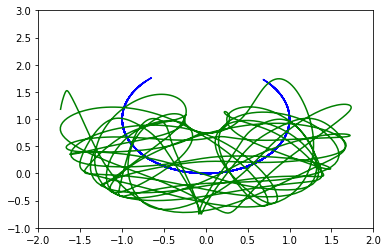

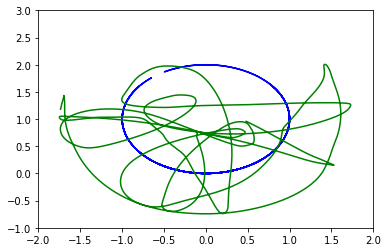

Iteration 0145 | Total Loss 1.763892
Iteration 0146 | Total Loss 1.922010


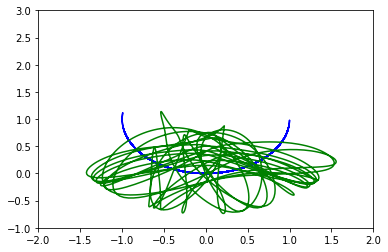

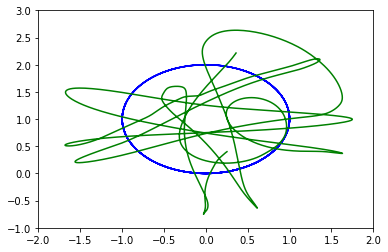

Iteration 0147 | Total Loss 1.697475
Iteration 0148 | Total Loss 1.880691


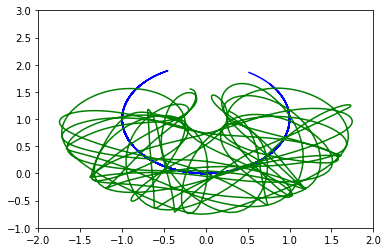

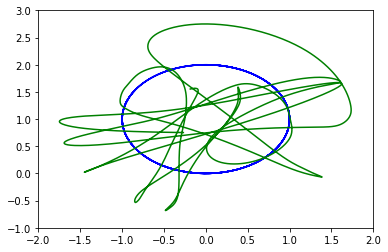

Iteration 0149 | Total Loss 1.639843
Iteration 0150 | Total Loss 1.857778


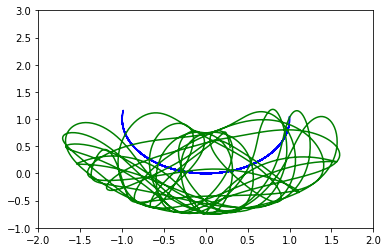

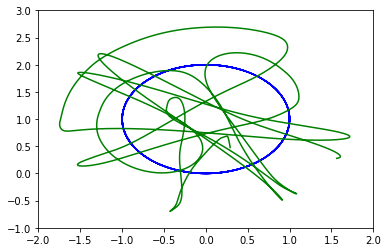

Iteration 0151 | Total Loss 1.608797
Iteration 0152 | Total Loss 1.830650


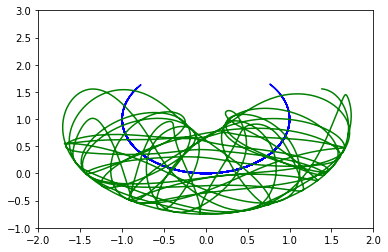

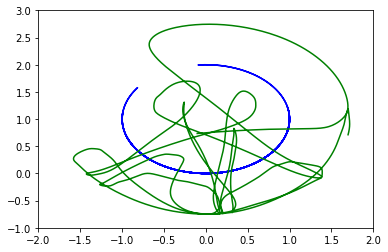

Iteration 0153 | Total Loss 1.584585
Iteration 0154 | Total Loss 1.784326


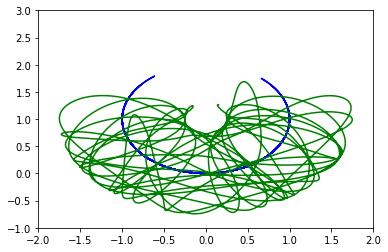

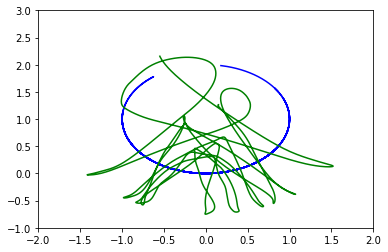

Iteration 0155 | Total Loss 1.544273
Iteration 0156 | Total Loss 1.716380


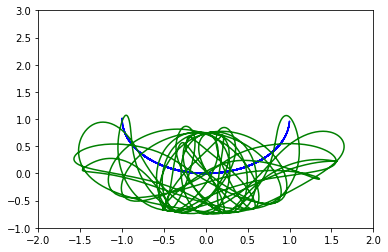

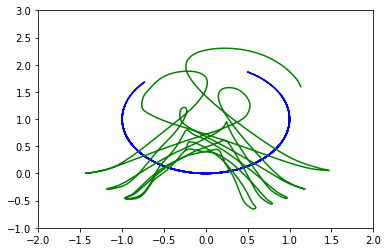

Iteration 0157 | Total Loss 1.492340
Iteration 0158 | Total Loss 1.664044


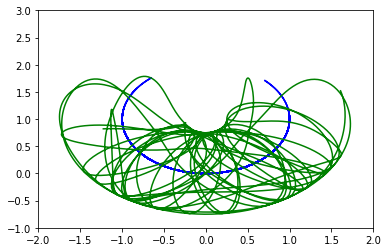

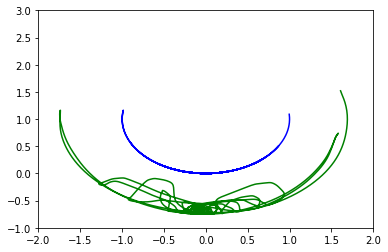

Iteration 0159 | Total Loss 1.462626
Iteration 0160 | Total Loss 1.674348


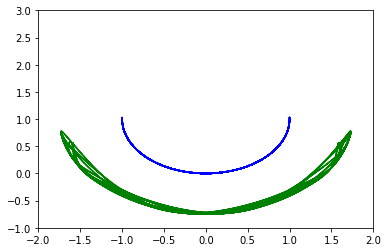

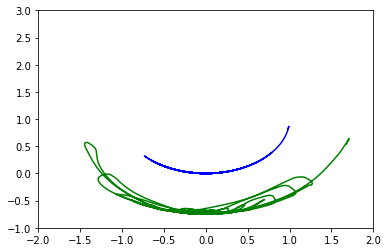

Iteration 0161 | Total Loss 1.478938
Iteration 0162 | Total Loss 1.745062


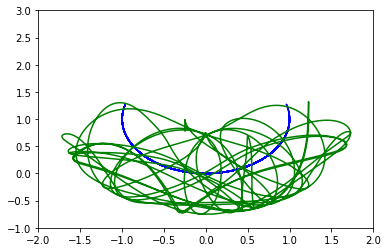

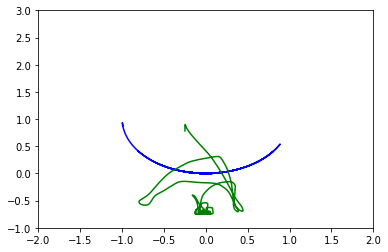

Iteration 0163 | Total Loss 1.535025
Iteration 0164 | Total Loss 1.826564


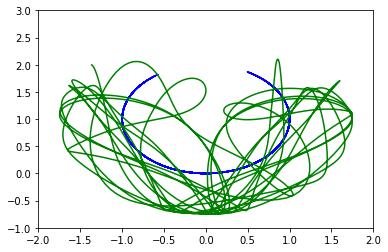

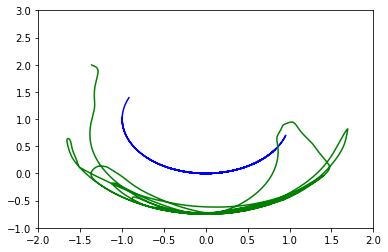

Iteration 0165 | Total Loss 1.593498
Iteration 0166 | Total Loss 1.854687


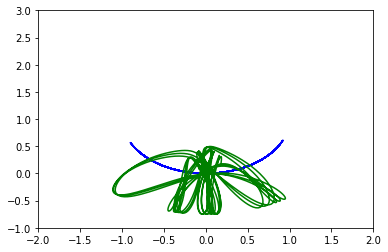

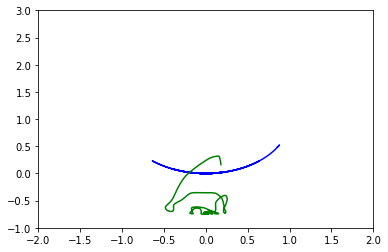

Iteration 0167 | Total Loss 1.613777
Iteration 0168 | Total Loss 1.825905


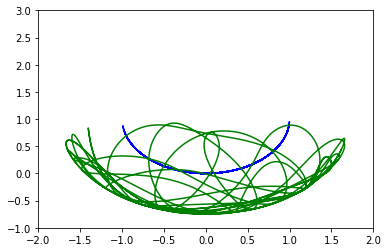

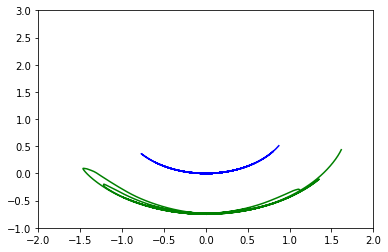

Iteration 0169 | Total Loss 1.605576
Iteration 0170 | Total Loss 1.773698


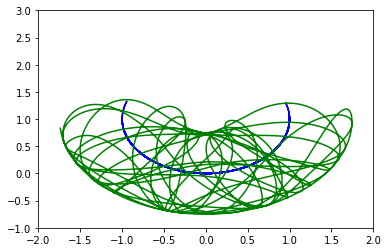

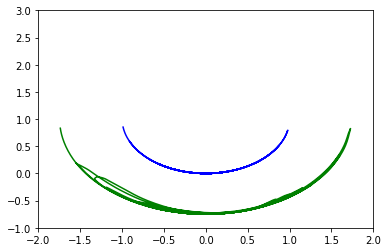

Iteration 0171 | Total Loss 1.566149
Iteration 0172 | Total Loss 1.683509


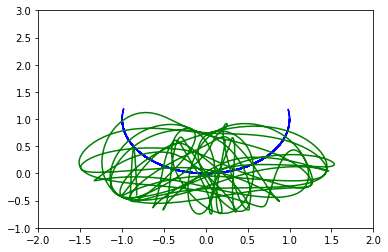

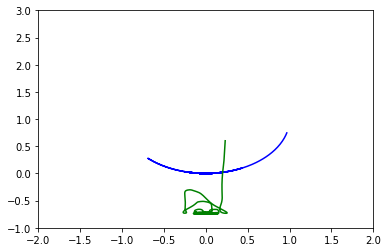

Iteration 0173 | Total Loss 1.463535
Iteration 0174 | Total Loss 1.577708


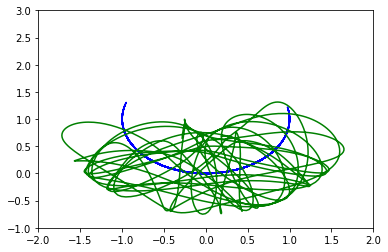

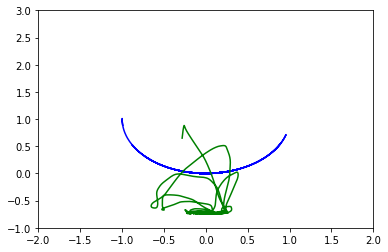

Iteration 0175 | Total Loss 1.380049
Iteration 0176 | Total Loss 1.528621


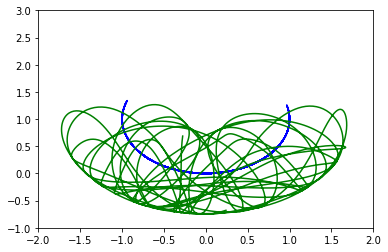

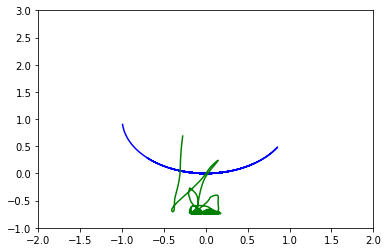

Iteration 0177 | Total Loss 1.370798
Iteration 0178 | Total Loss 1.576578


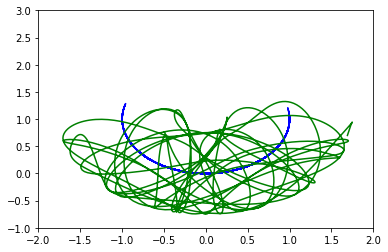

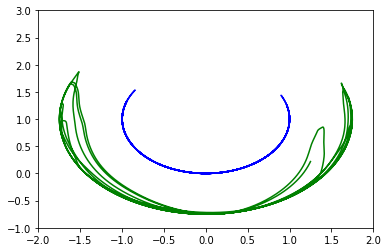

Iteration 0179 | Total Loss 1.439005
Iteration 0180 | Total Loss 1.691076


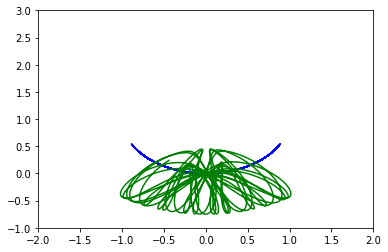

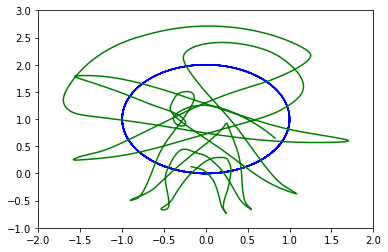

Iteration 0181 | Total Loss 1.517688
Iteration 0182 | Total Loss 1.732750


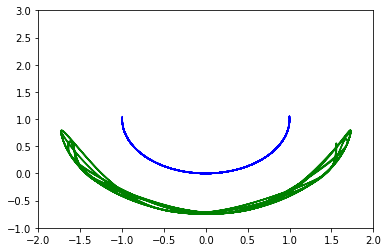

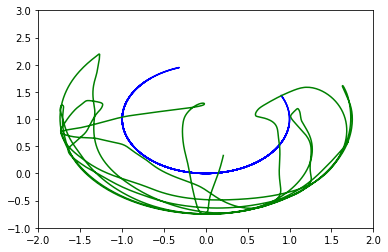

Iteration 0183 | Total Loss 1.482599
Iteration 0184 | Total Loss 1.621595


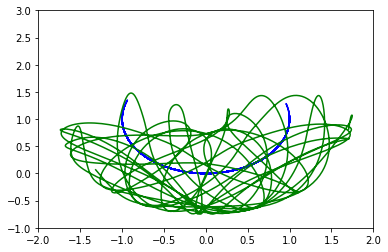

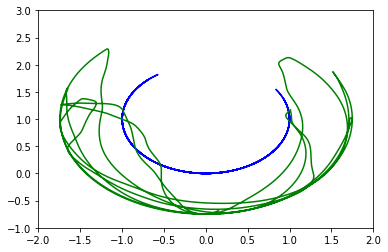

Iteration 0185 | Total Loss 1.360332
Iteration 0186 | Total Loss 1.483672


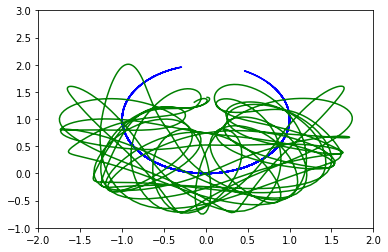

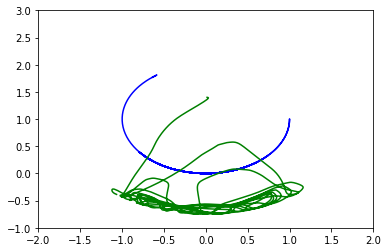

Iteration 0187 | Total Loss 1.254260
Iteration 0188 | Total Loss 1.390697


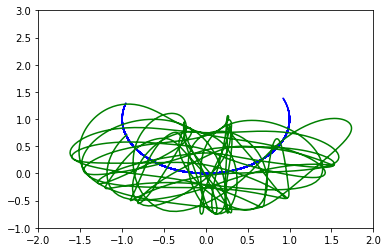

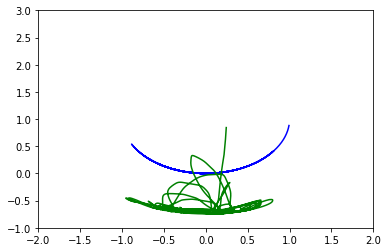

Iteration 0189 | Total Loss 1.192271
Iteration 0190 | Total Loss 1.345241


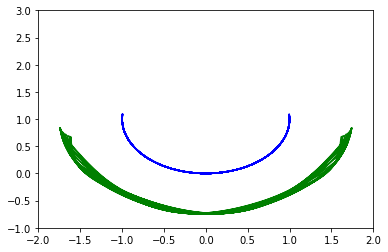

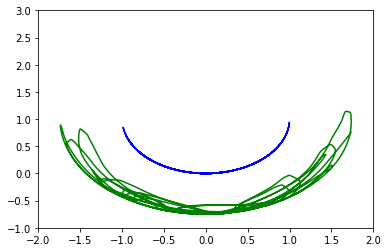

Iteration 0191 | Total Loss 1.166224
Iteration 0192 | Total Loss 1.333017


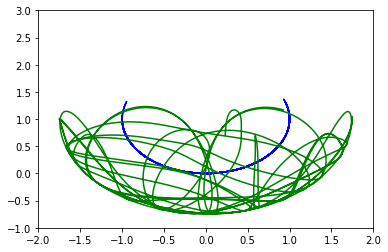

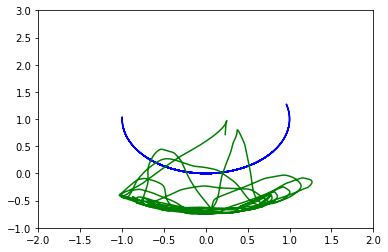

Iteration 0193 | Total Loss 1.160690
Iteration 0194 | Total Loss 1.333047


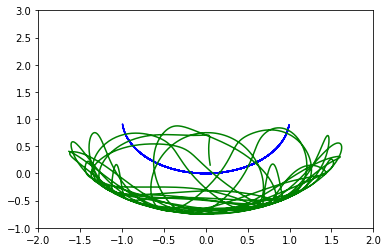

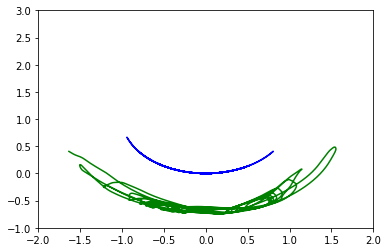

Iteration 0195 | Total Loss 1.160645
Iteration 0196 | Total Loss 1.332045


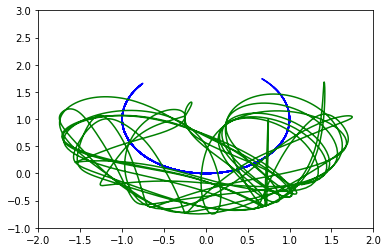

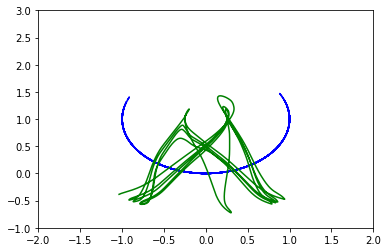

Iteration 0197 | Total Loss 1.161362
Iteration 0198 | Total Loss 1.337709


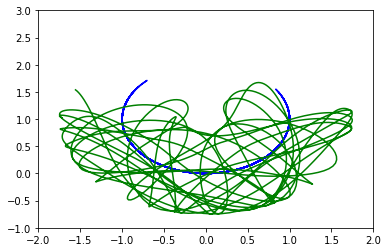

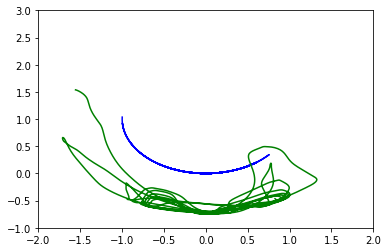

Iteration 0199 | Total Loss 1.171918
Iteration 0200 | Total Loss 1.362628


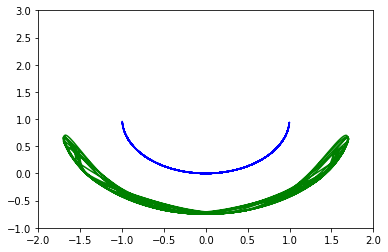

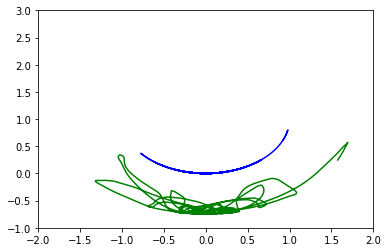

Iteration 0201 | Total Loss 1.189980
Iteration 0202 | Total Loss 1.380124


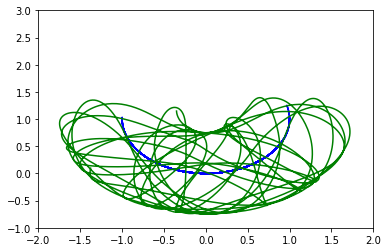

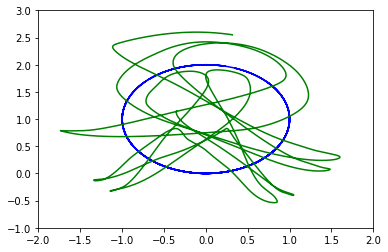

Iteration 0203 | Total Loss 1.186672
Iteration 0204 | Total Loss 1.350509


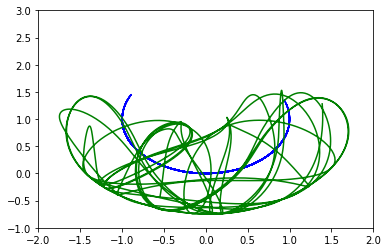

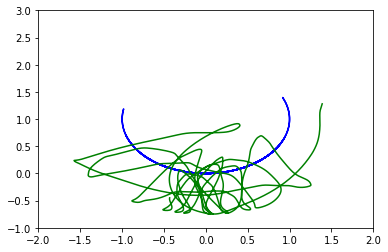

Iteration 0205 | Total Loss 1.156780
Iteration 0206 | Total Loss 1.297191


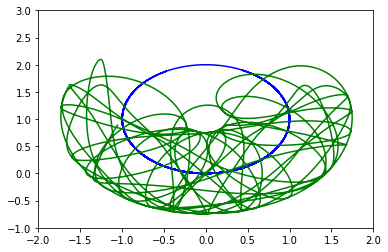

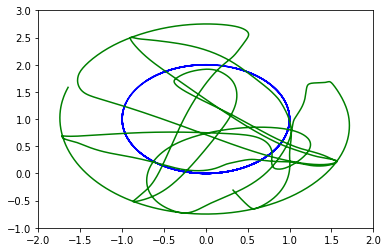

Iteration 0207 | Total Loss 1.124014
Iteration 0208 | Total Loss 1.265442


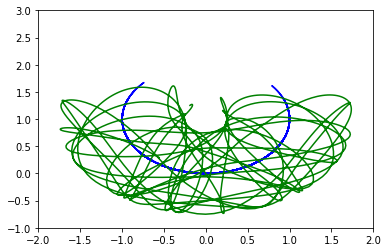

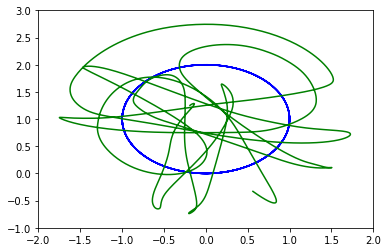

Iteration 0209 | Total Loss 1.110561
Iteration 0210 | Total Loss 1.284003


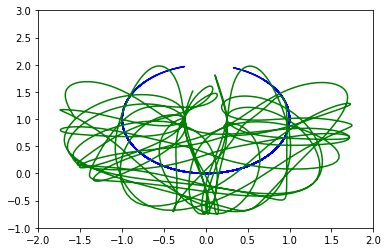

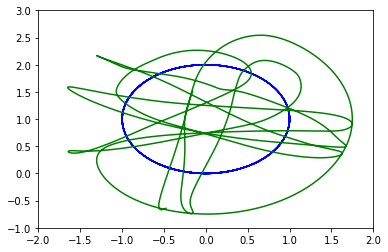

Iteration 0211 | Total Loss 1.138947
Iteration 0212 | Total Loss 1.365134


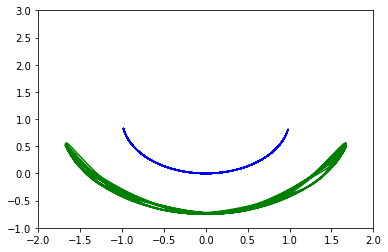

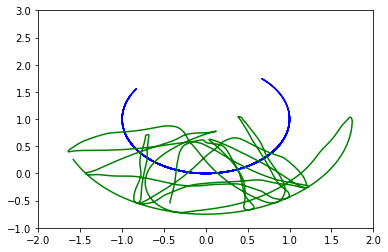

Iteration 0213 | Total Loss 1.232737
Iteration 0214 | Total Loss 1.540685


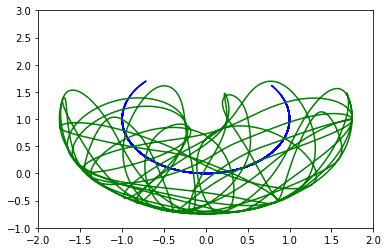

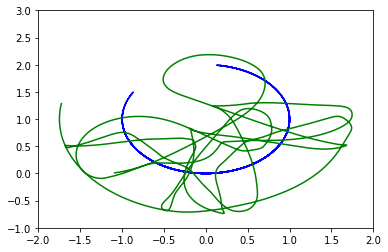

Iteration 0215 | Total Loss 1.452870
Iteration 0216 | Total Loss 1.900183


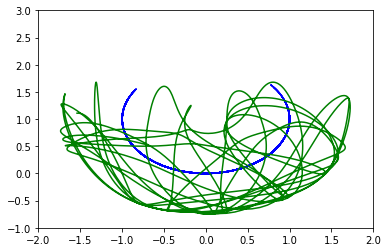

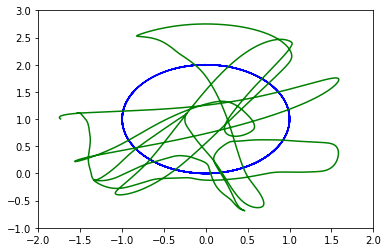

Iteration 0217 | Total Loss 1.656265
Iteration 0218 | Total Loss 1.948424


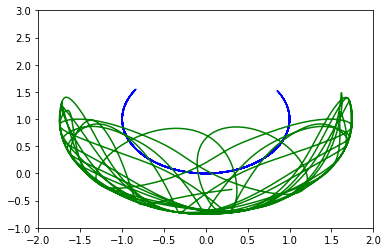

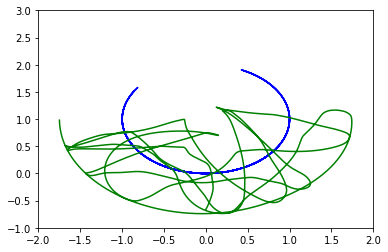

Iteration 0219 | Total Loss 1.524584
Iteration 0220 | Total Loss 1.635502


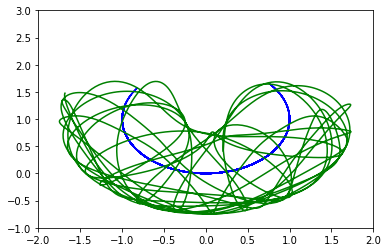

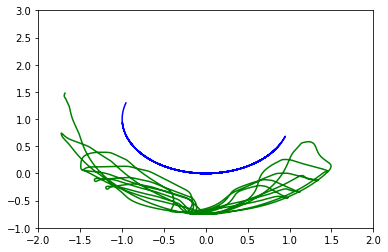

Iteration 0221 | Total Loss 1.439069
Iteration 0222 | Total Loss 1.460907


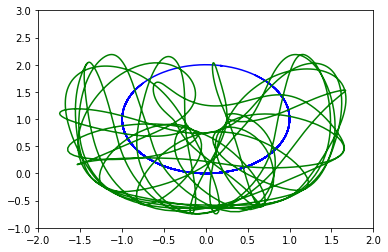

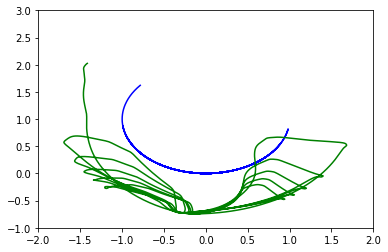

Iteration 0223 | Total Loss 1.376219
Iteration 0224 | Total Loss 1.316069


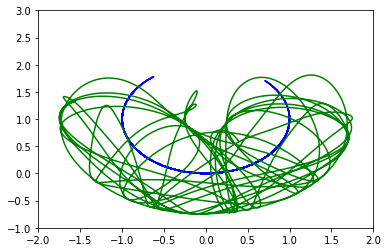

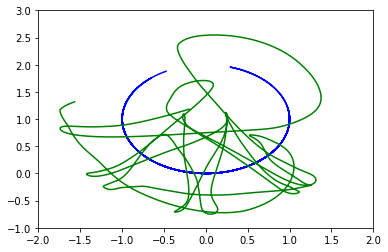

Iteration 0225 | Total Loss 1.200272
Iteration 0226 | Total Loss 1.130892


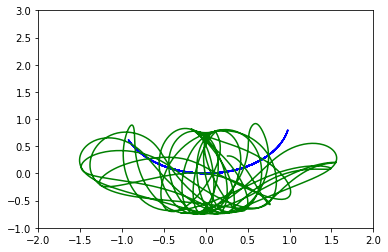

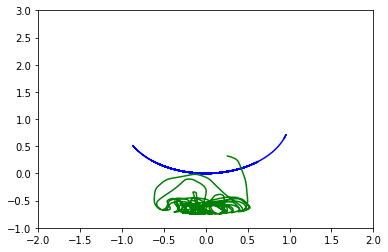

Iteration 0227 | Total Loss 1.006774
Iteration 0228 | Total Loss 0.980698


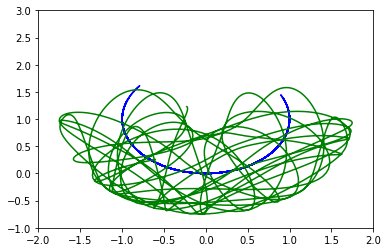

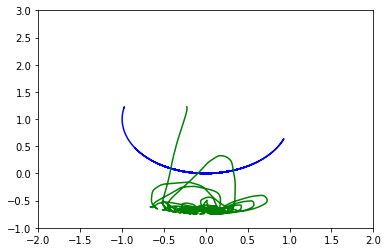

Iteration 0229 | Total Loss 0.901532
Iteration 0230 | Total Loss 0.945669


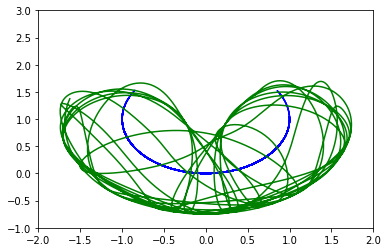

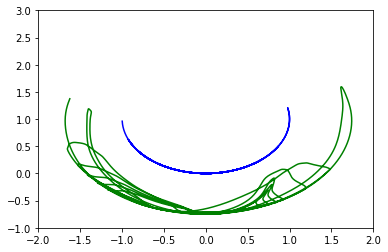

Iteration 0231 | Total Loss 0.895892
Iteration 0232 | Total Loss 1.031989


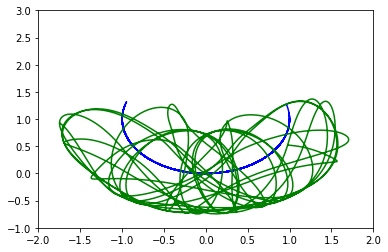

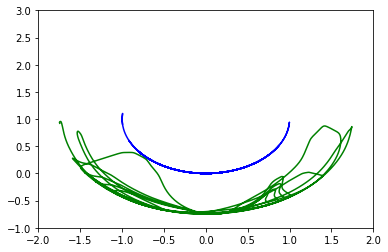

Iteration 0233 | Total Loss 0.948629
Iteration 0234 | Total Loss 1.170163


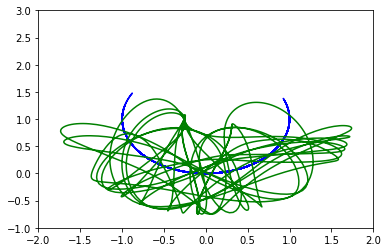

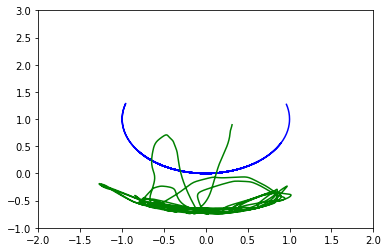

Iteration 0235 | Total Loss 1.001512
Iteration 0236 | Total Loss 1.238087


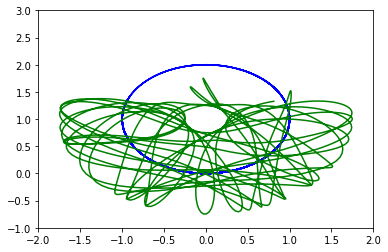

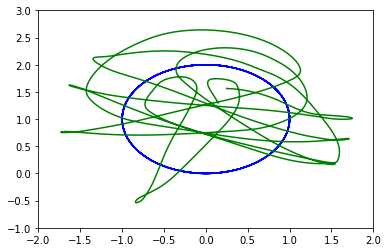

Iteration 0237 | Total Loss 1.006648
Iteration 0238 | Total Loss 1.191771


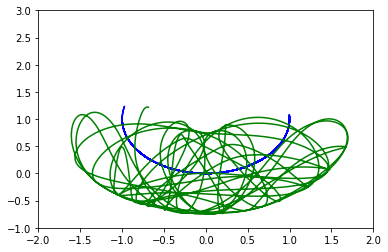

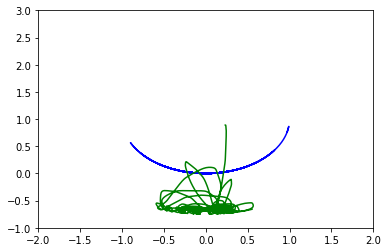

Iteration 0239 | Total Loss 0.969118
Iteration 0240 | Total Loss 1.097941


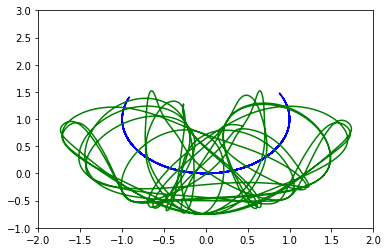

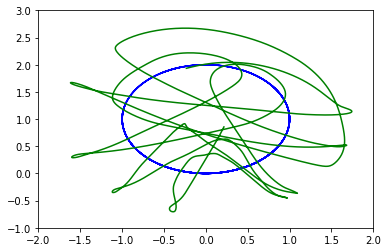

Iteration 0241 | Total Loss 0.928484
Iteration 0242 | Total Loss 1.029765


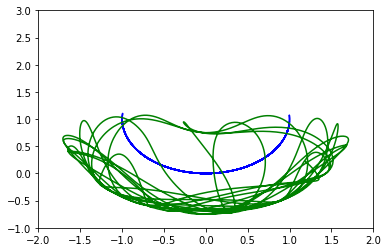

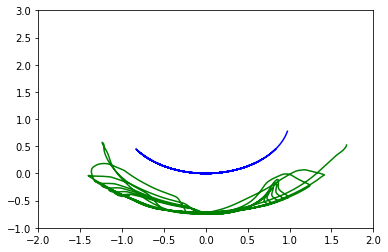

Iteration 0243 | Total Loss 0.925540
Iteration 0244 | Total Loss 1.042134


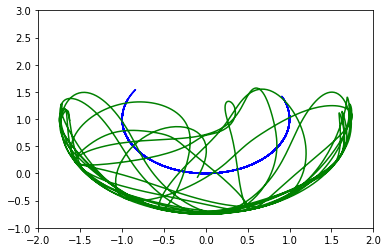

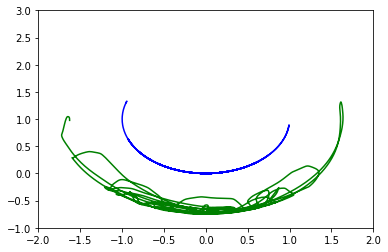

Iteration 0245 | Total Loss 1.021670
Iteration 0246 | Total Loss 1.230181


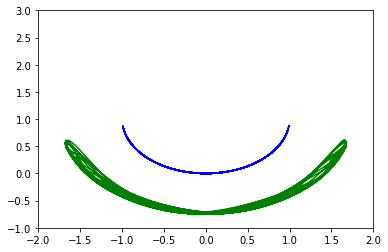

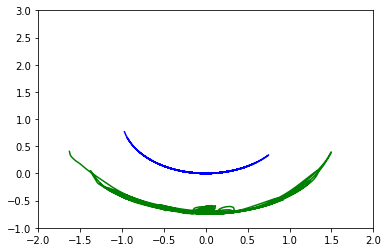

Iteration 0247 | Total Loss 1.333504
Iteration 0248 | Total Loss 1.640438


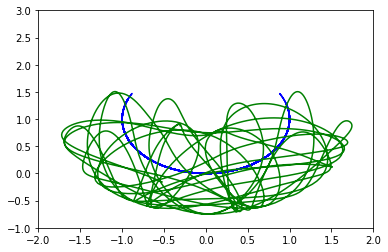

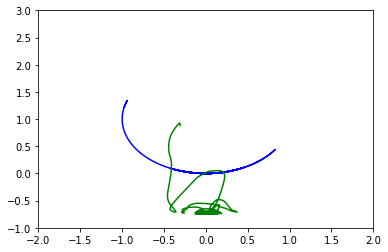

Iteration 0249 | Total Loss 1.752232
Iteration 0250 | Total Loss 1.961807


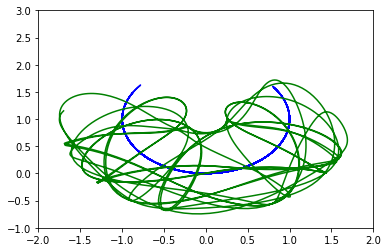

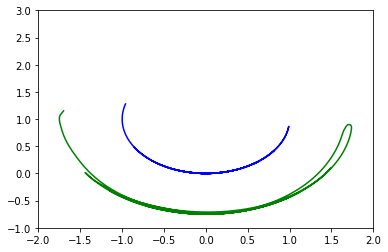

Iteration 0251 | Total Loss 1.805092
Iteration 0252 | Total Loss 1.719518


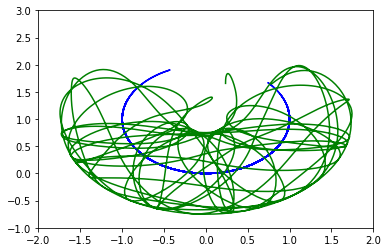

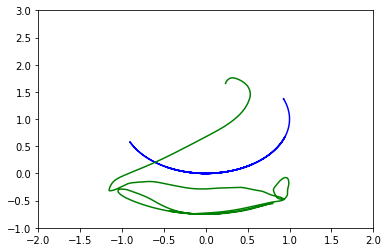

Iteration 0253 | Total Loss 1.238407
Iteration 0254 | Total Loss 1.193362


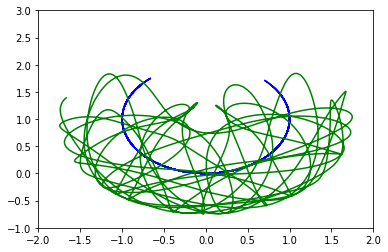

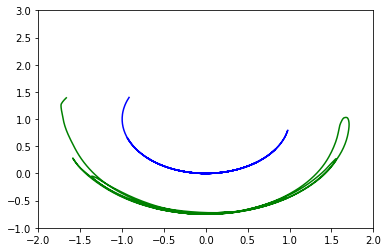

Iteration 0255 | Total Loss 0.935155
Iteration 0256 | Total Loss 0.965917


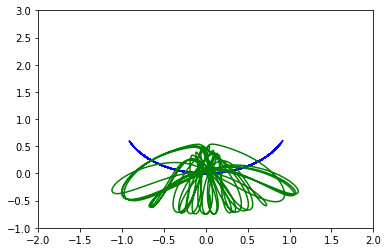

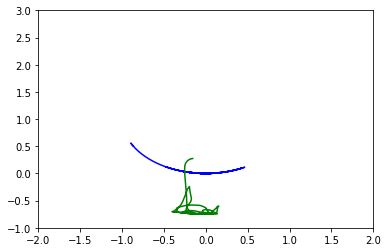

Iteration 0257 | Total Loss 0.863513
Iteration 0258 | Total Loss 0.930934


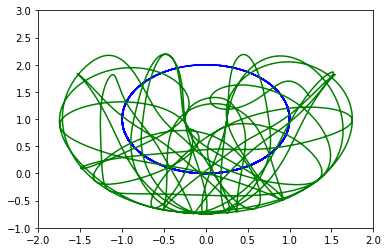

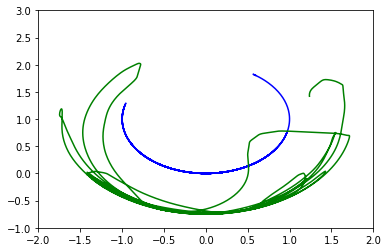

Iteration 0259 | Total Loss 0.870286
Iteration 0260 | Total Loss 0.977753


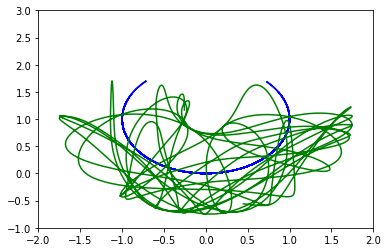

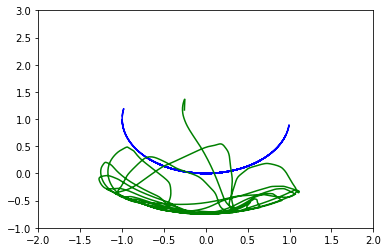

Iteration 0261 | Total Loss 0.926529
Iteration 0262 | Total Loss 1.087856


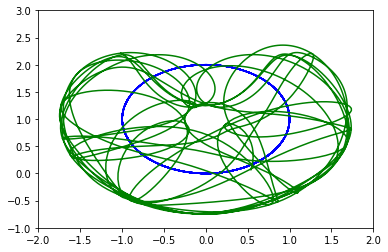

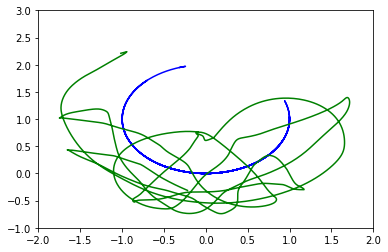

Iteration 0263 | Total Loss 1.013546
Iteration 0264 | Total Loss 1.218507


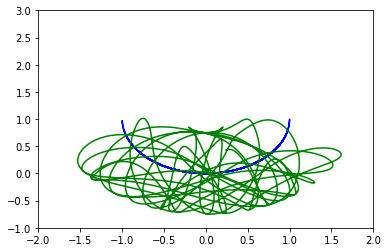

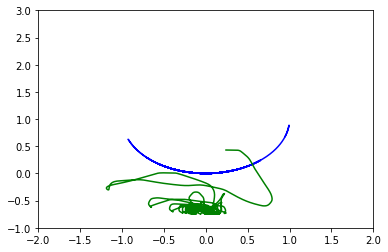

Iteration 0265 | Total Loss 1.091703
Iteration 0266 | Total Loss 1.314338


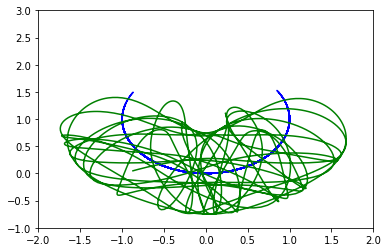

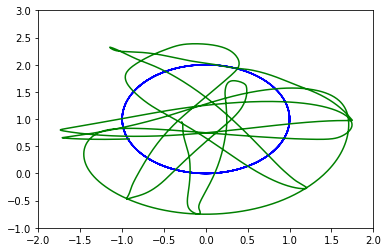

Iteration 0267 | Total Loss 1.134296
Iteration 0268 | Total Loss 1.326421


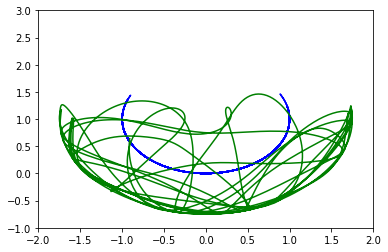

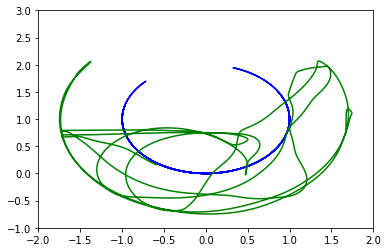

Iteration 0269 | Total Loss 1.120770
Iteration 0270 | Total Loss 1.229561


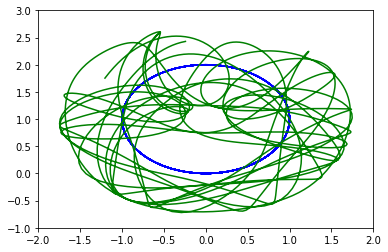

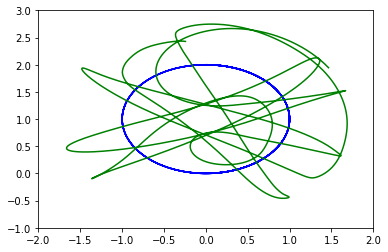

Iteration 0271 | Total Loss 1.052976
Iteration 0272 | Total Loss 1.083667


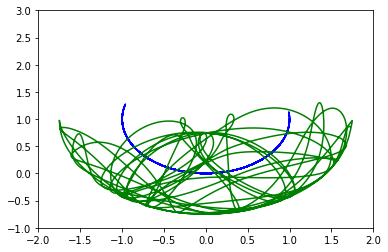

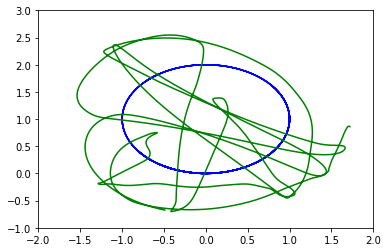

Iteration 0273 | Total Loss 0.958266
Iteration 0274 | Total Loss 0.955871


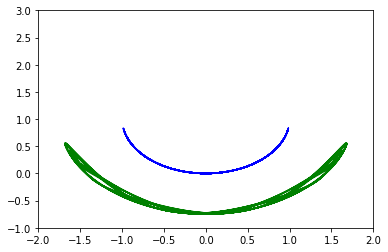

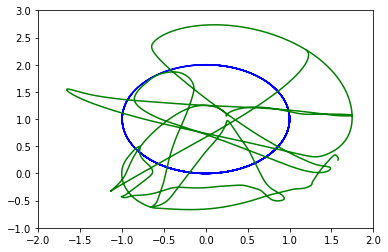

Iteration 0275 | Total Loss 0.871947
Iteration 0276 | Total Loss 0.873481


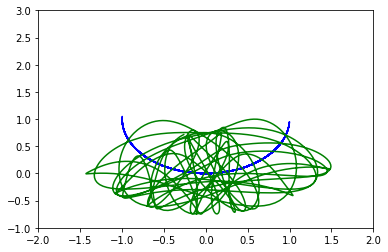

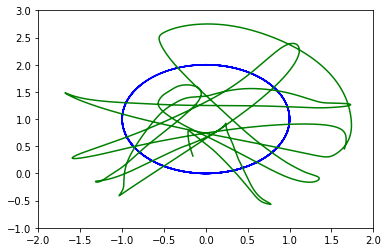

Iteration 0277 | Total Loss 0.811245
Iteration 0278 | Total Loss 0.843132


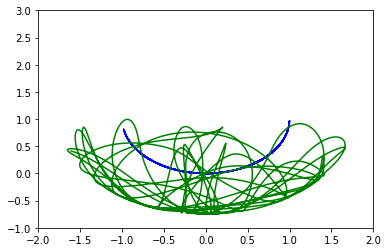

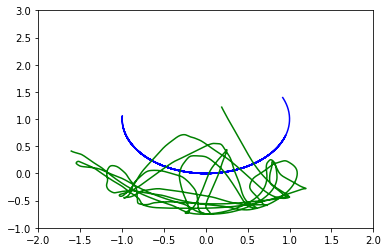

Iteration 0279 | Total Loss 0.791572
Iteration 0280 | Total Loss 0.875053


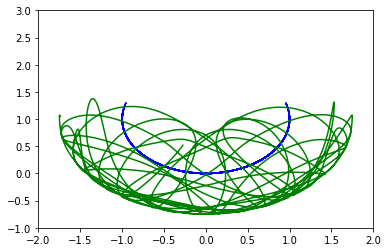

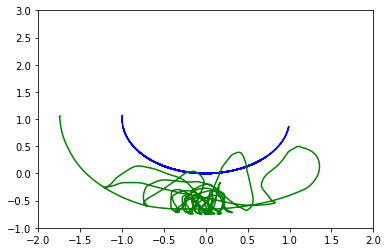

Iteration 0281 | Total Loss 0.814672
Iteration 0282 | Total Loss 0.965999


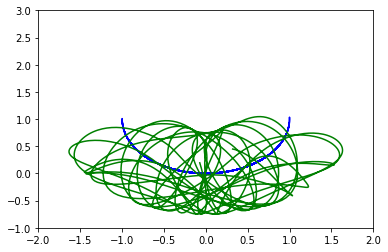

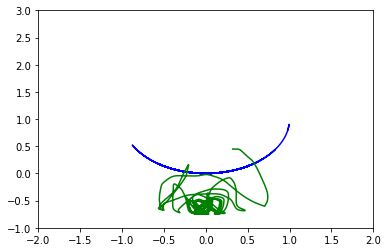

Iteration 0283 | Total Loss 0.867688
Iteration 0284 | Total Loss 1.075275


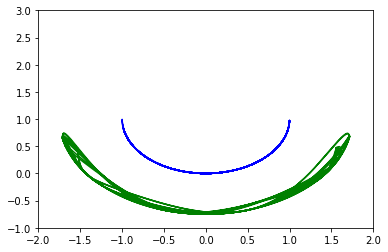

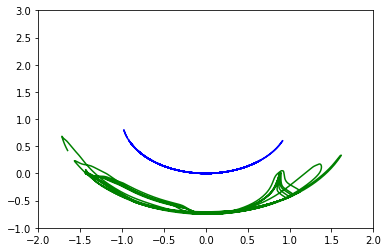

Iteration 0285 | Total Loss 0.925458
Iteration 0286 | Total Loss 1.146911


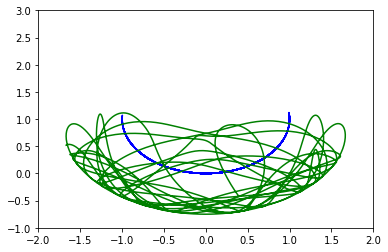

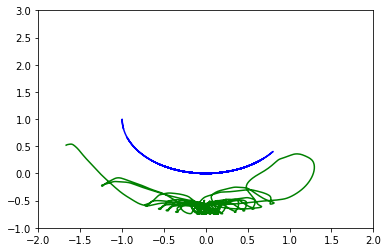

Iteration 0287 | Total Loss 0.954512
Iteration 0288 | Total Loss 1.139377


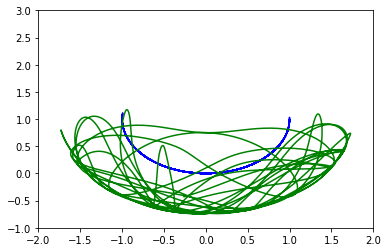

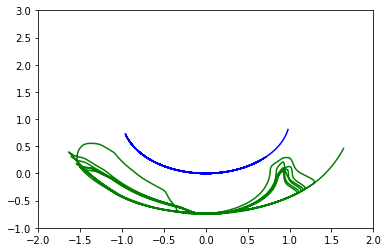

Iteration 0289 | Total Loss 0.922807
Iteration 0290 | Total Loss 1.034915


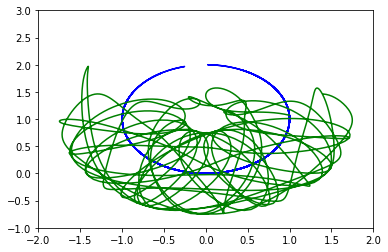

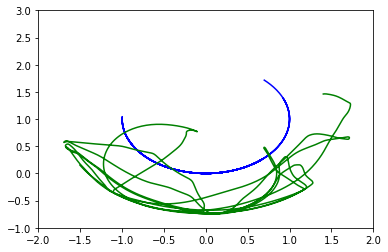

Iteration 0291 | Total Loss 0.830504
Iteration 0292 | Total Loss 0.879307


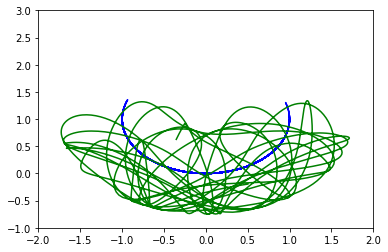

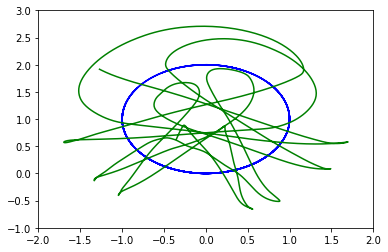

Iteration 0293 | Total Loss 0.742271
Iteration 0294 | Total Loss 0.779577


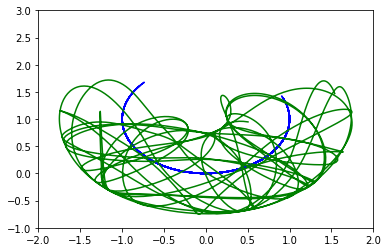

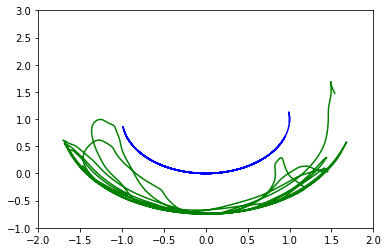

Iteration 0295 | Total Loss 0.717036
Iteration 0296 | Total Loss 0.787047


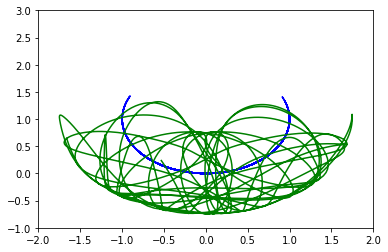

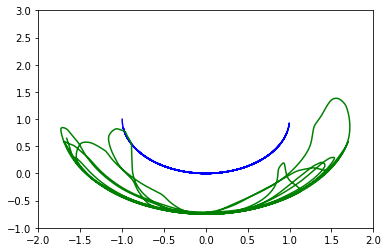

Iteration 0297 | Total Loss 0.779931
Iteration 0298 | Total Loss 0.910174


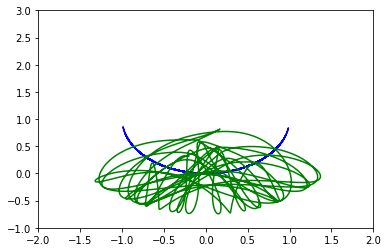

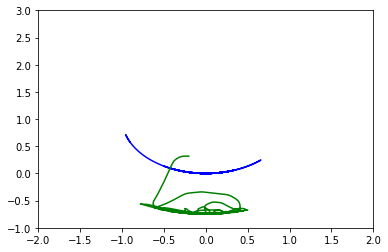

Iteration 0299 | Total Loss 0.912854
Iteration 0300 | Total Loss 1.084197


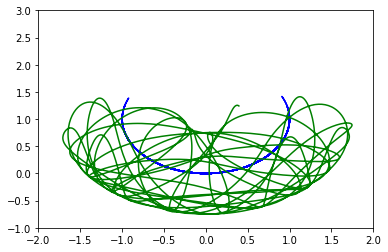

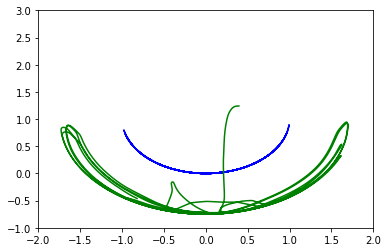

Iteration 0301 | Total Loss 1.008217
Iteration 0302 | Total Loss 1.242831


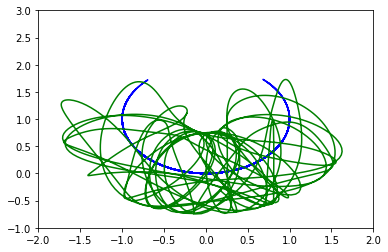

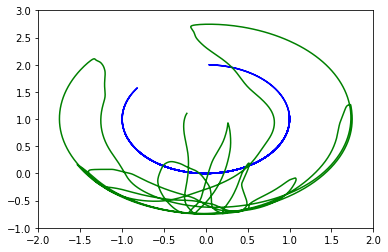

Iteration 0303 | Total Loss 1.089143
Iteration 0304 | Total Loss 1.356653


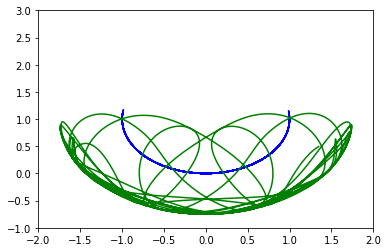

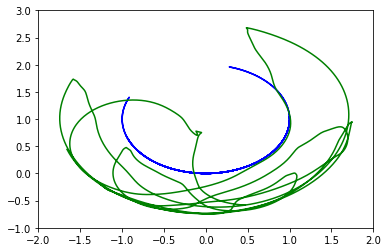

Iteration 0305 | Total Loss 1.100805
Iteration 0306 | Total Loss 1.259549


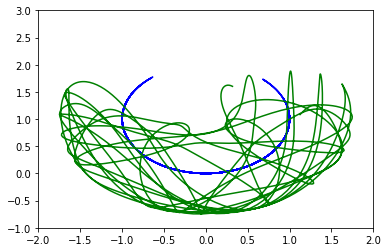

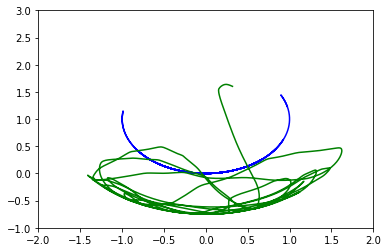

Iteration 0307 | Total Loss 0.970589
Iteration 0308 | Total Loss 1.011899


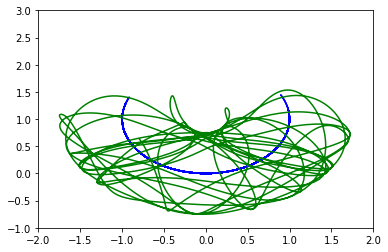

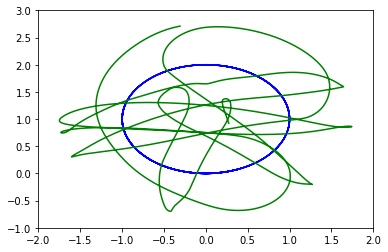

Iteration 0309 | Total Loss 0.805409
Iteration 0310 | Total Loss 0.803815


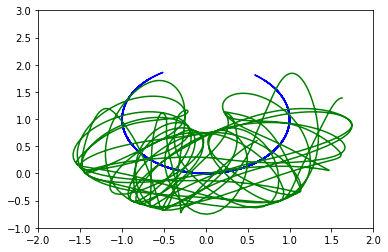

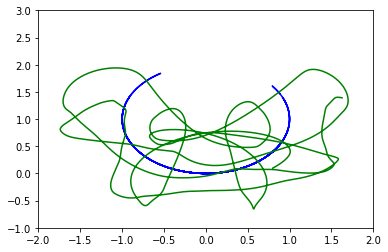

Iteration 0311 | Total Loss 0.702382
Iteration 0312 | Total Loss 0.743692


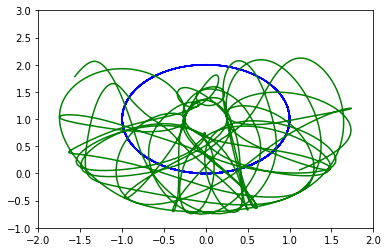

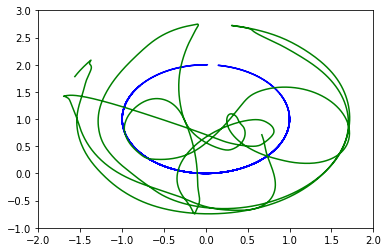

Iteration 0313 | Total Loss 0.709134
Iteration 0314 | Total Loss 0.859985


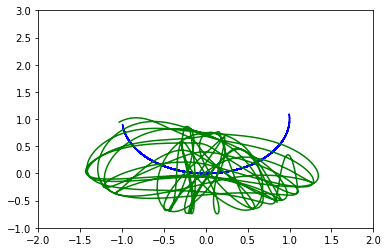

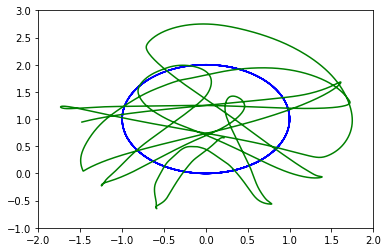

Iteration 0315 | Total Loss 0.840290
Iteration 0316 | Total Loss 1.191039


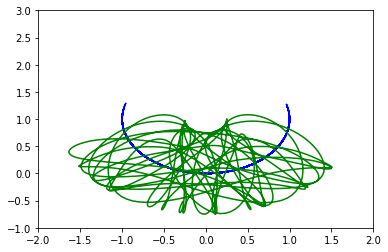

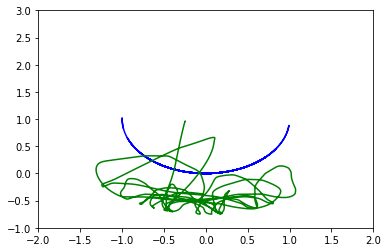

Iteration 0317 | Total Loss 1.156121
Iteration 0318 | Total Loss 1.771245


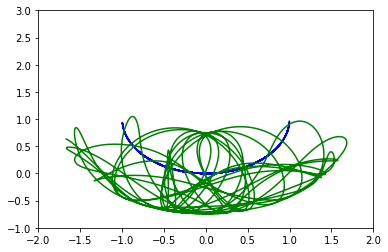

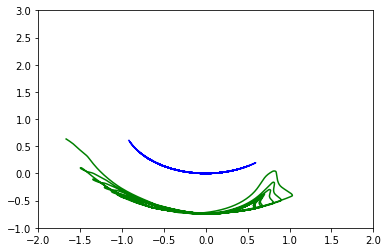

Iteration 0319 | Total Loss 1.528601
Iteration 0320 | Total Loss 2.024374


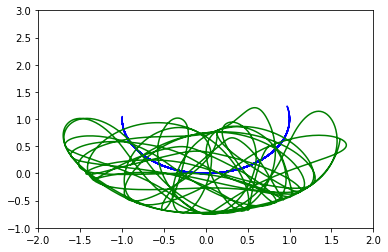

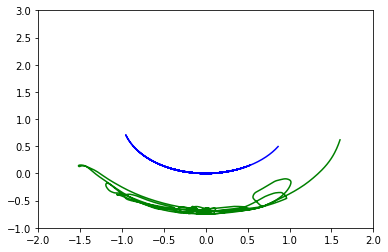

Iteration 0321 | Total Loss 1.403486
Iteration 0322 | Total Loss 1.539114


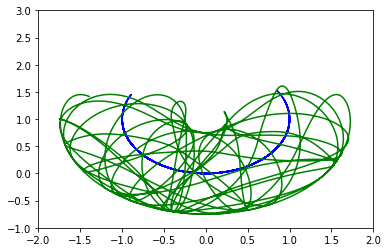

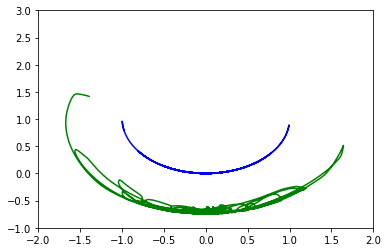

Iteration 0323 | Total Loss 1.120473
Iteration 0324 | Total Loss 1.068757


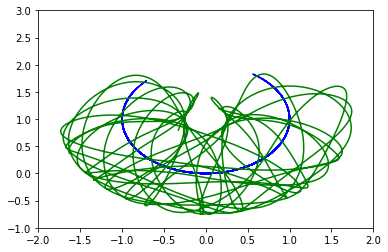

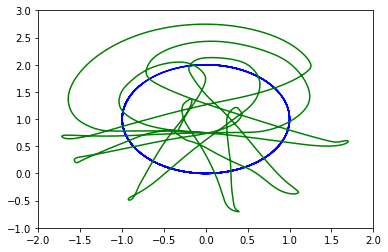

Iteration 0325 | Total Loss 0.868485
Iteration 0326 | Total Loss 0.834479


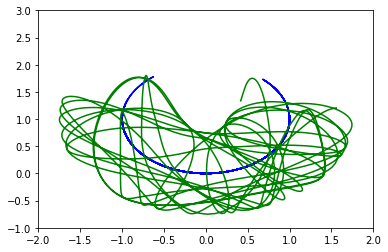

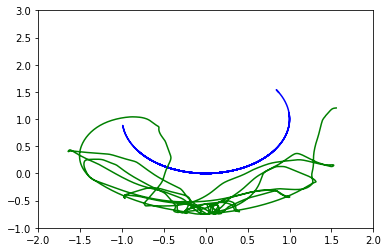

Iteration 0327 | Total Loss 0.809258
Iteration 0328 | Total Loss 0.791901


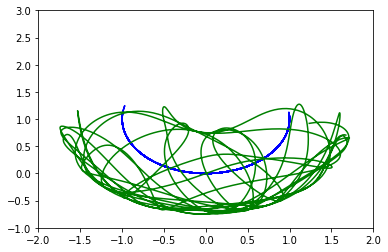

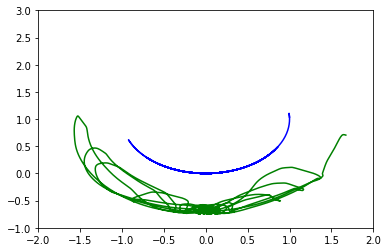

Iteration 0329 | Total Loss 0.785650
Iteration 0330 | Total Loss 0.765316


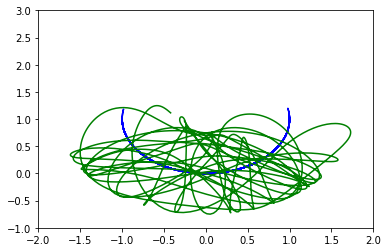

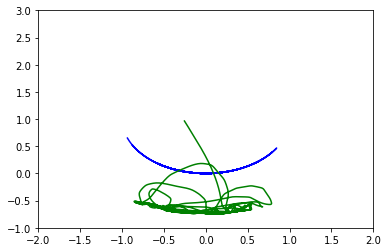

Iteration 0331 | Total Loss 0.749697
Iteration 0332 | Total Loss 0.758112


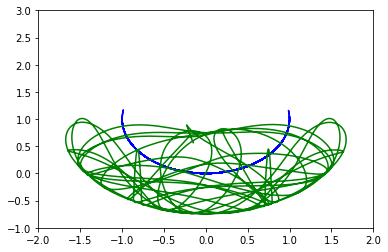

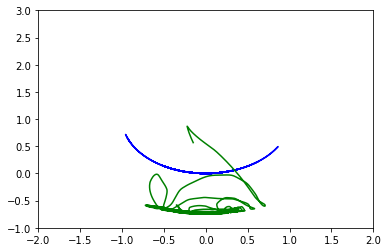

Iteration 0333 | Total Loss 0.743108
Iteration 0334 | Total Loss 0.810345


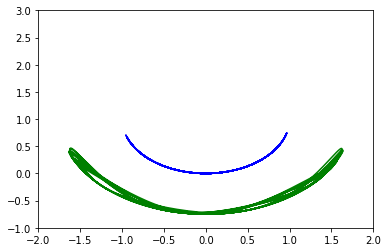

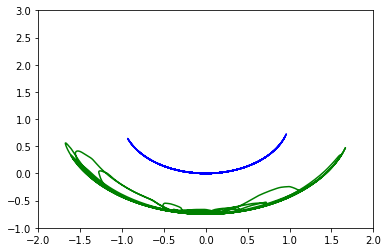

Iteration 0335 | Total Loss 0.781260
Iteration 0336 | Total Loss 0.912497


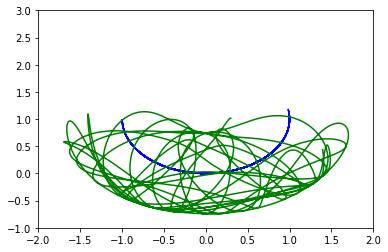

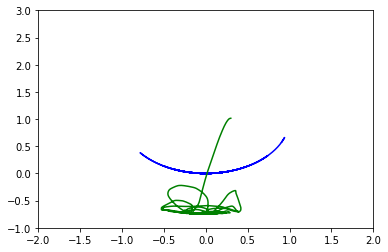

Iteration 0337 | Total Loss 0.822922
Iteration 0338 | Total Loss 0.976231


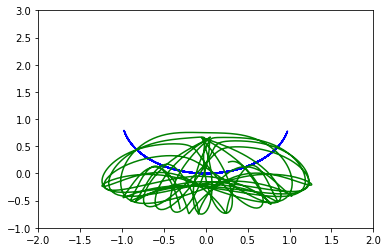

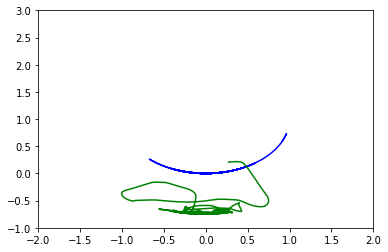

Iteration 0339 | Total Loss 0.827137
Iteration 0340 | Total Loss 0.971796


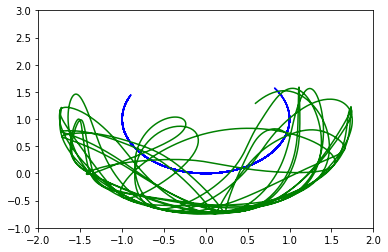

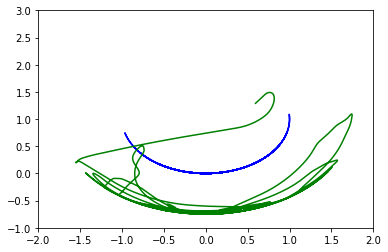

Iteration 0341 | Total Loss 0.805248
Iteration 0342 | Total Loss 0.930122


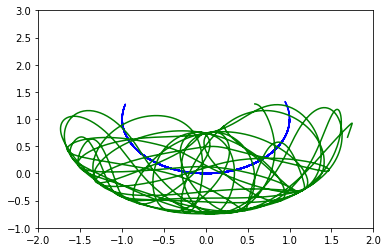

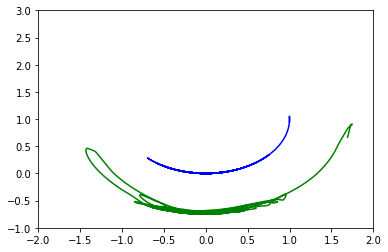

Iteration 0343 | Total Loss 0.774375
Iteration 0344 | Total Loss 0.875923


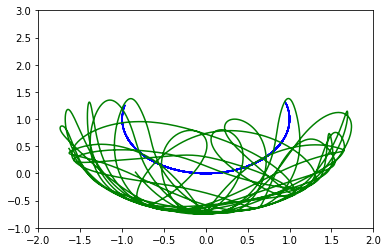

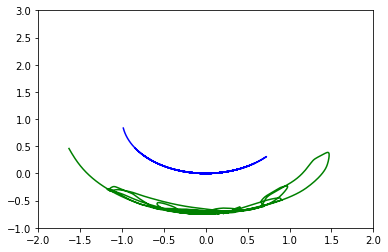

Iteration 0345 | Total Loss 0.743954
Iteration 0346 | Total Loss 0.828651


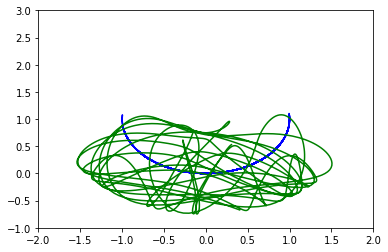

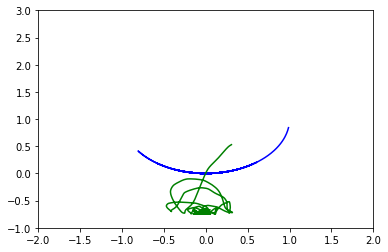

Iteration 0347 | Total Loss 0.722962
Iteration 0348 | Total Loss 0.802032


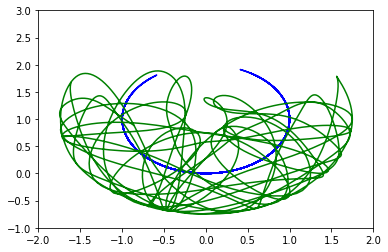

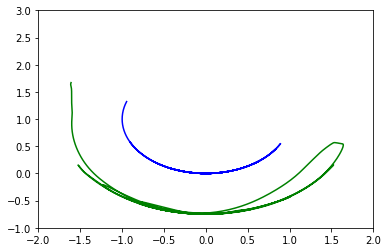

Iteration 0349 | Total Loss 0.715866
Iteration 0350 | Total Loss 0.798465


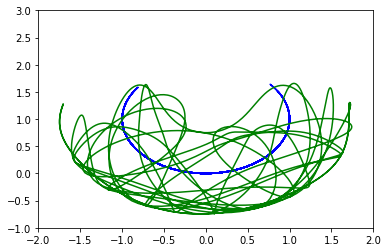

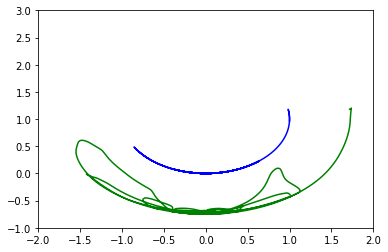

Iteration 0351 | Total Loss 0.720568
Iteration 0352 | Total Loss 0.812032


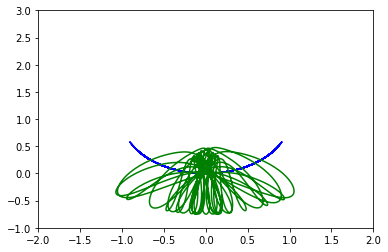

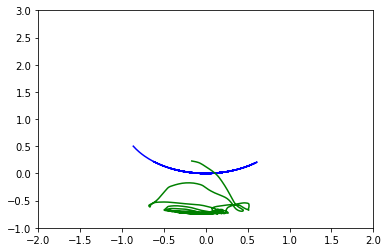

Iteration 0353 | Total Loss 0.731286
Iteration 0354 | Total Loss 0.834460


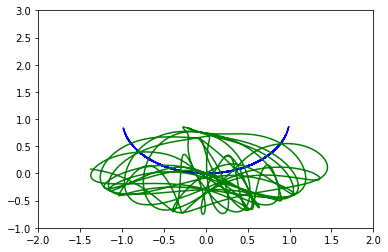

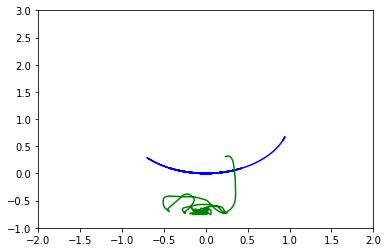

Iteration 0355 | Total Loss 0.742688
Iteration 0356 | Total Loss 0.859391


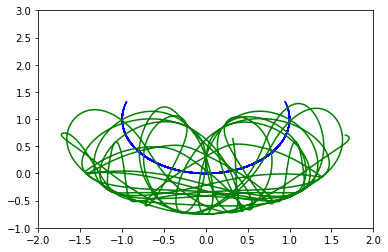

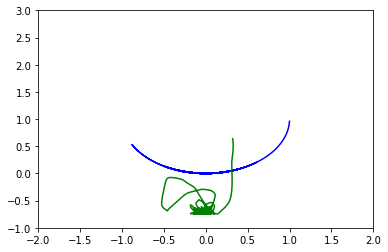

Iteration 0357 | Total Loss 0.752719
Iteration 0358 | Total Loss 0.881489


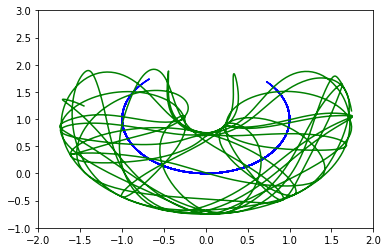

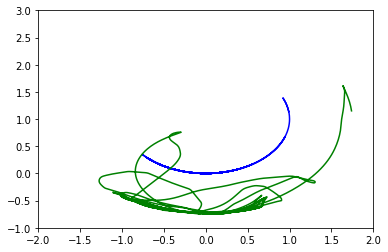

Iteration 0359 | Total Loss 0.758021
Iteration 0360 | Total Loss 0.886868


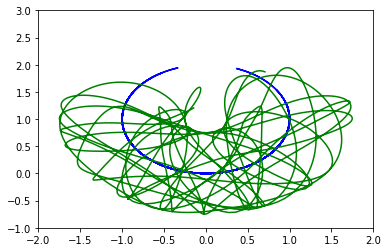

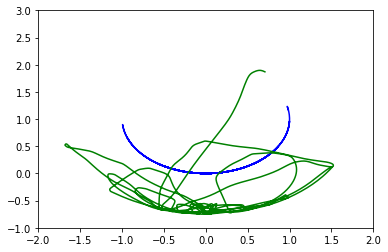

Iteration 0361 | Total Loss 0.749774
Iteration 0362 | Total Loss 0.867311


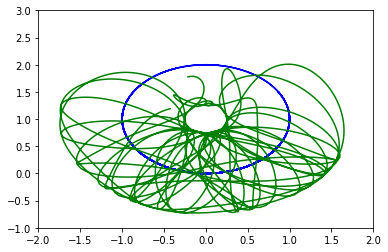

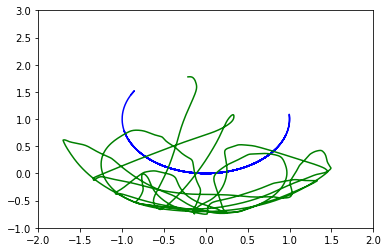

Iteration 0363 | Total Loss 0.737099
Iteration 0364 | Total Loss 0.854733


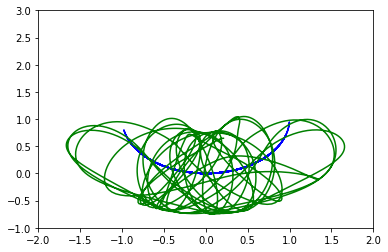

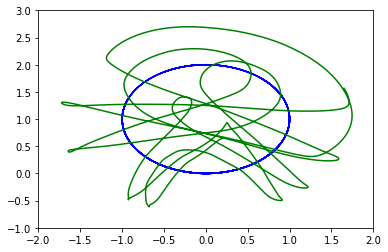

Iteration 0365 | Total Loss 0.754310
Iteration 0366 | Total Loss 0.892628


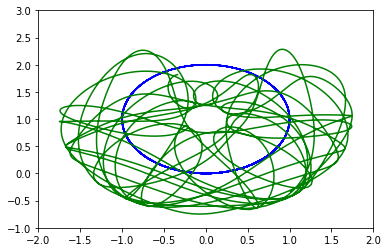

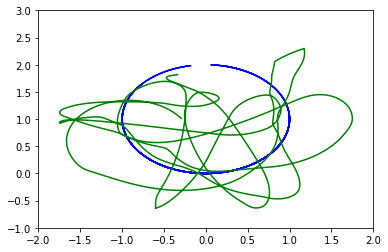

Iteration 0367 | Total Loss 0.831807
Iteration 0368 | Total Loss 1.001187


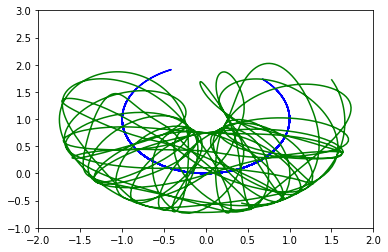

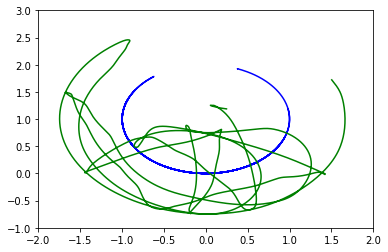

Iteration 0369 | Total Loss 0.994429
Iteration 0370 | Total Loss 1.251333


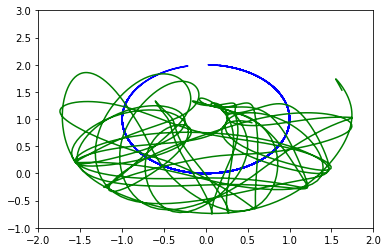

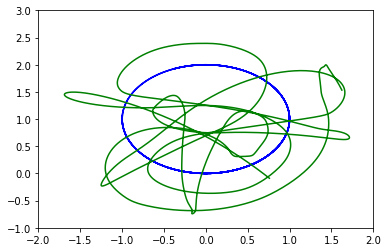

Iteration 0371 | Total Loss 1.432102
Iteration 0372 | Total Loss 1.893251


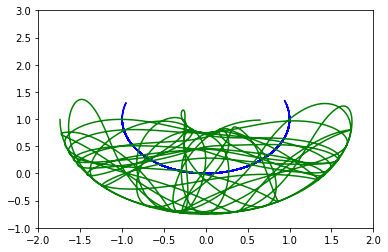

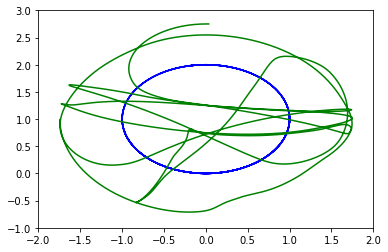

Iteration 0373 | Total Loss 1.663329
Iteration 0374 | Total Loss 1.779400


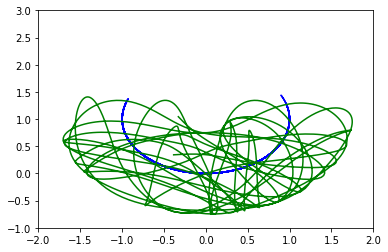

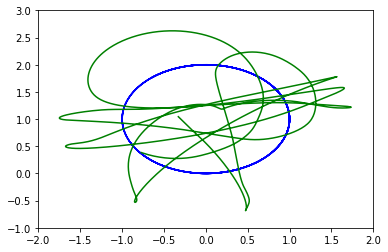

Iteration 0375 | Total Loss 1.465711
Iteration 0376 | Total Loss 1.475940


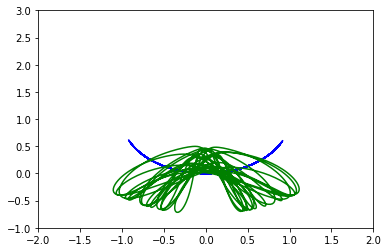

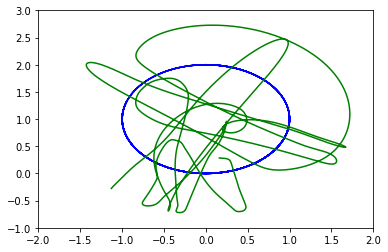

Iteration 0377 | Total Loss 1.150817
Iteration 0378 | Total Loss 1.159528


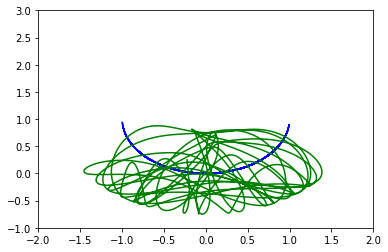

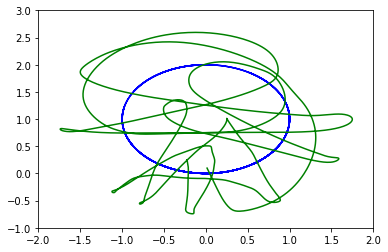

Iteration 0379 | Total Loss 0.925117
Iteration 0380 | Total Loss 0.927062


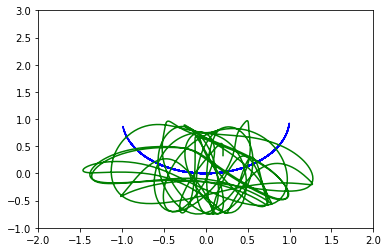

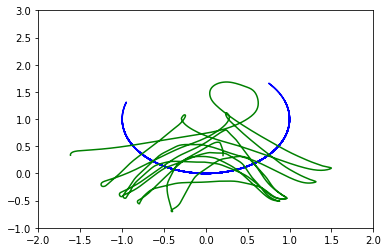

Iteration 0381 | Total Loss 0.743666
Iteration 0382 | Total Loss 0.722074


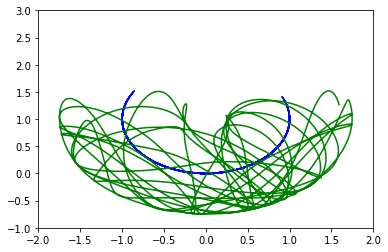

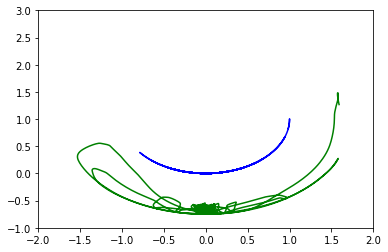

Iteration 0383 | Total Loss 0.628179
Iteration 0384 | Total Loss 0.617420


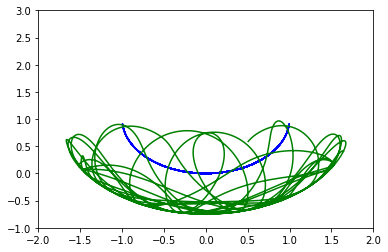

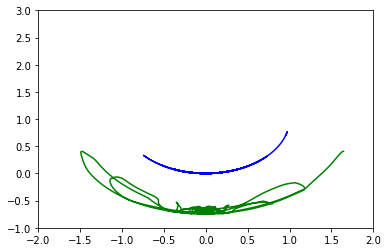

Iteration 0385 | Total Loss 0.578239
Iteration 0386 | Total Loss 0.582771


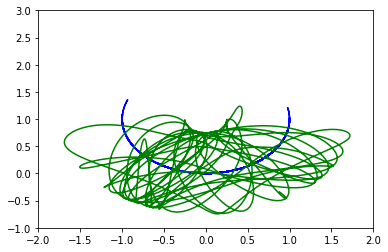

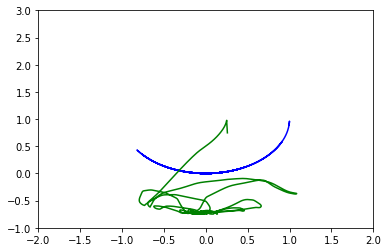

Iteration 0387 | Total Loss 0.563480
Iteration 0388 | Total Loss 0.586079


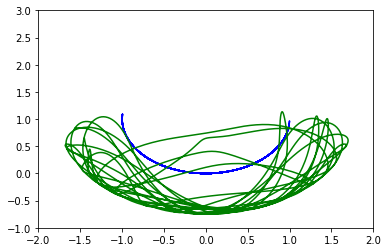

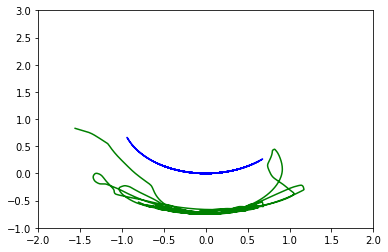

Iteration 0389 | Total Loss 0.575762
Iteration 0390 | Total Loss 0.628813


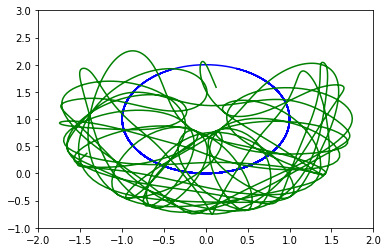

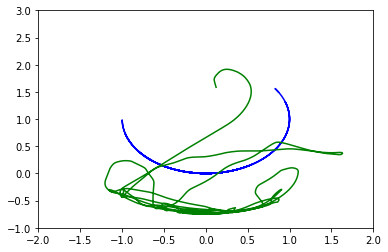

Iteration 0391 | Total Loss 0.616815
Iteration 0392 | Total Loss 0.718224


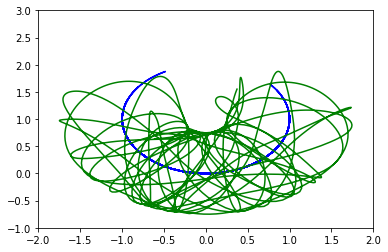

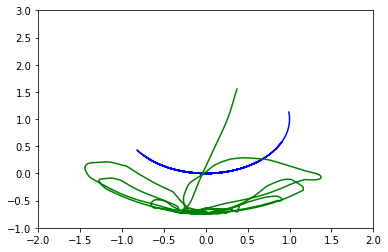

Iteration 0393 | Total Loss 0.682422
Iteration 0394 | Total Loss 0.835803


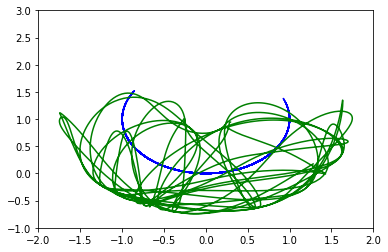

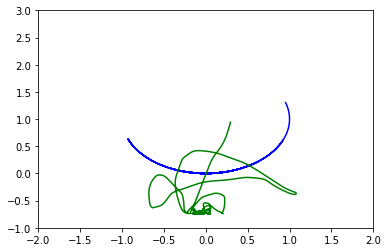

Iteration 0395 | Total Loss 0.755026
Iteration 0396 | Total Loss 0.934777


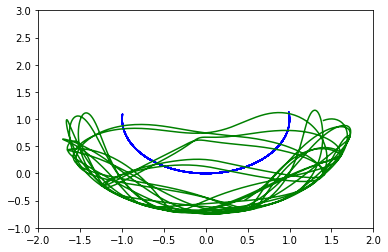

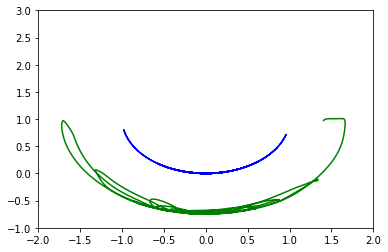

Iteration 0397 | Total Loss 0.809806
Iteration 0398 | Total Loss 0.964428


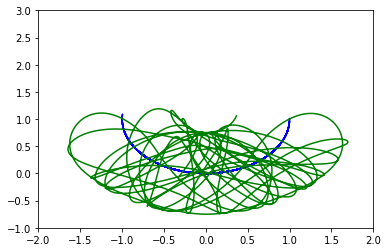

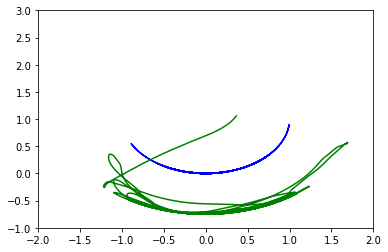

Iteration 0399 | Total Loss 0.807929
Iteration 0400 | Total Loss 0.887855


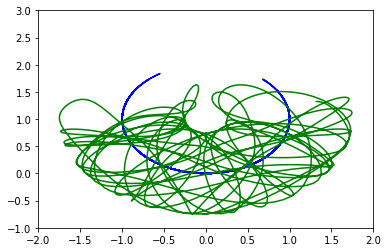

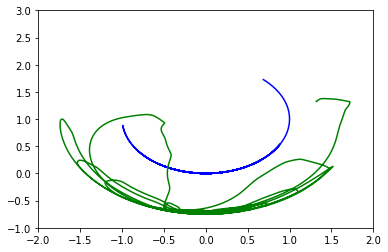

Iteration 0401 | Total Loss 0.727110
Iteration 0402 | Total Loss 0.751427


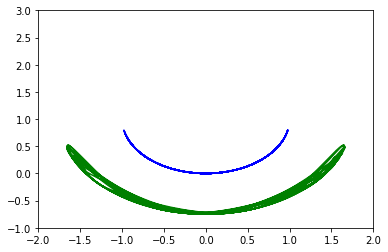

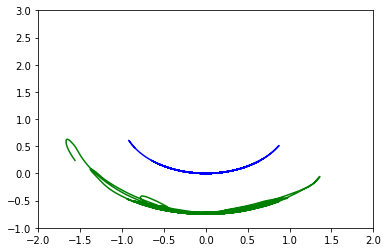

Iteration 0403 | Total Loss 0.635150
Iteration 0404 | Total Loss 0.654211


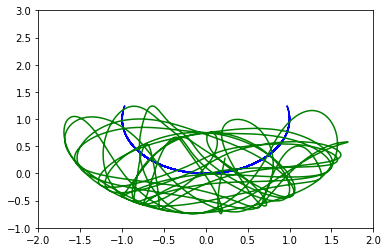

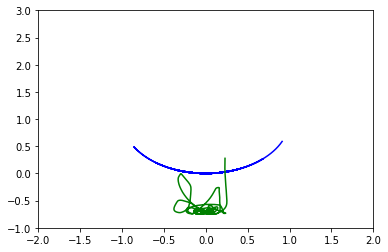

Iteration 0405 | Total Loss 0.586502
Iteration 0406 | Total Loss 0.621120


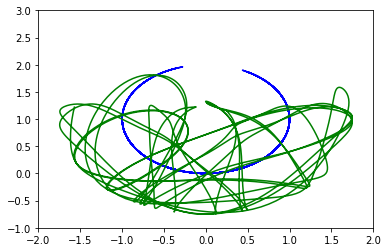

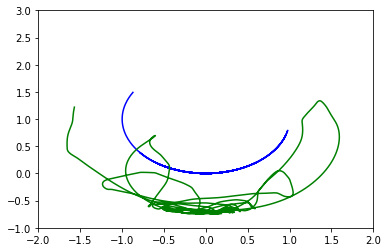

Iteration 0407 | Total Loss 0.582172
Iteration 0408 | Total Loss 0.642077


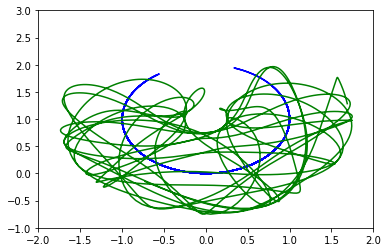

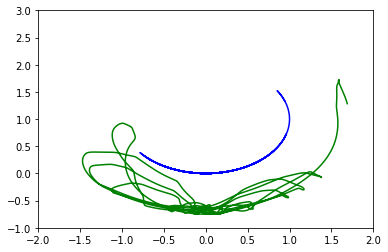

Iteration 0409 | Total Loss 0.619420
Iteration 0410 | Total Loss 0.718300


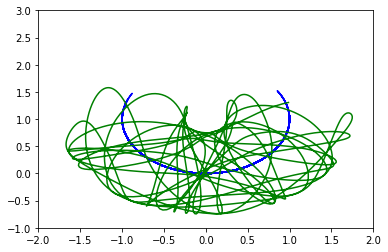

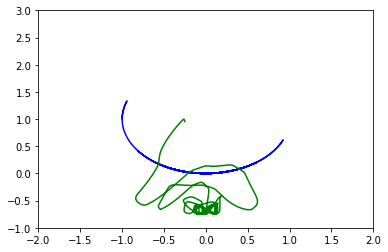

Iteration 0411 | Total Loss 0.710685
Iteration 0412 | Total Loss 0.874521


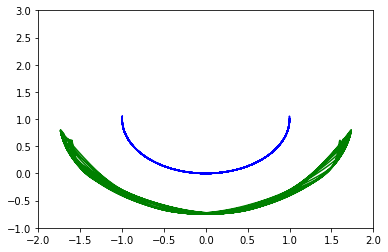

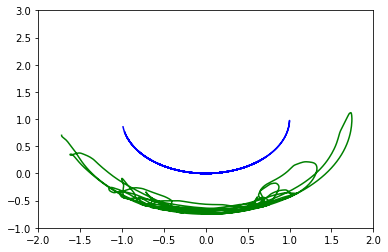

Iteration 0413 | Total Loss 0.910409
Iteration 0414 | Total Loss 1.208057


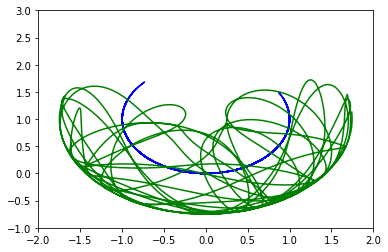

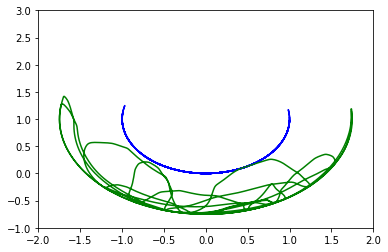

Iteration 0415 | Total Loss 1.358284
Iteration 0416 | Total Loss 1.917970


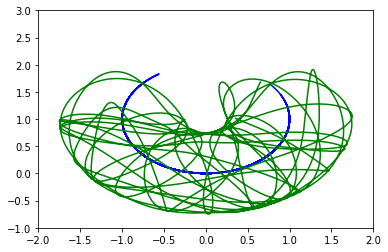

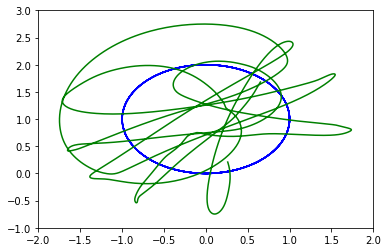

Iteration 0417 | Total Loss 1.688818
Iteration 0418 | Total Loss 1.930555


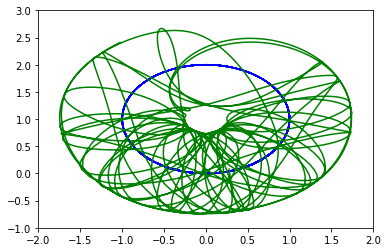

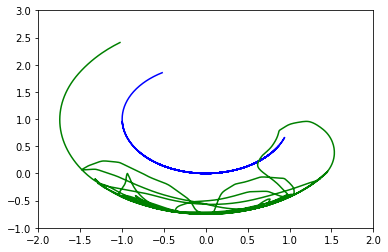

Iteration 0419 | Total Loss 1.336687
Iteration 0420 | Total Loss 1.183324


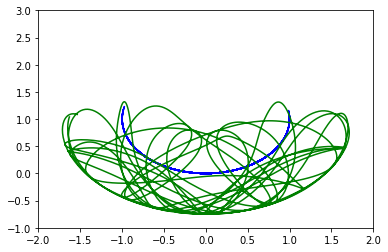

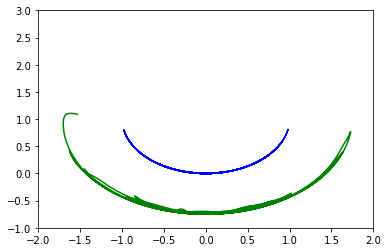

Iteration 0421 | Total Loss 0.761305
Iteration 0422 | Total Loss 0.650954


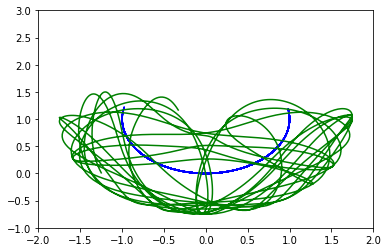

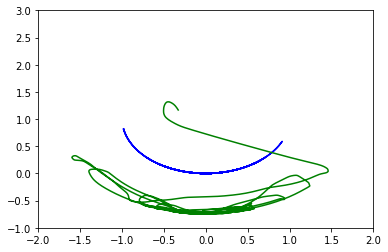

Iteration 0423 | Total Loss 0.539653
Iteration 0424 | Total Loss 0.510145


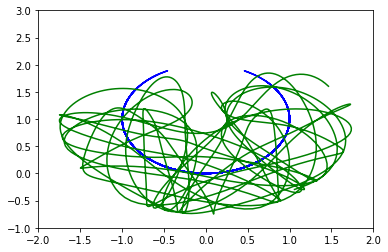

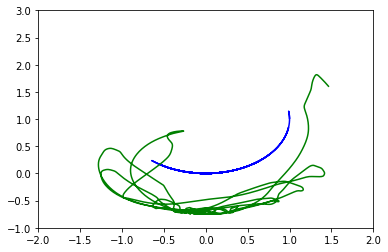

Iteration 0425 | Total Loss 0.490155
Iteration 0426 | Total Loss 0.487177


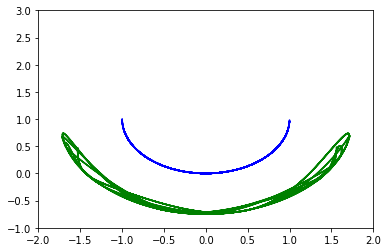

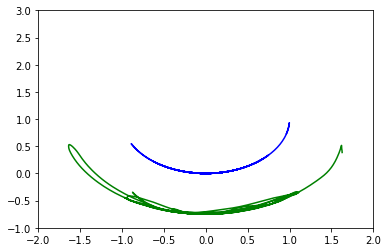

Iteration 0427 | Total Loss 0.490129
Iteration 0428 | Total Loss 0.502615


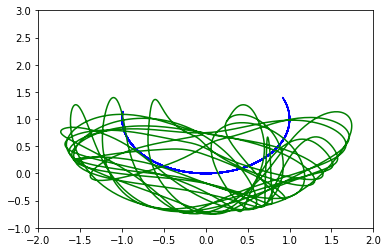

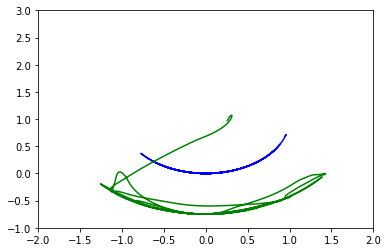

Iteration 0429 | Total Loss 0.520057
Iteration 0430 | Total Loss 0.546771


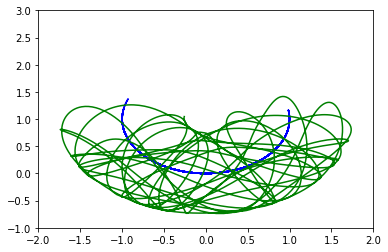

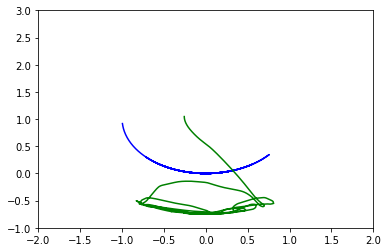

Iteration 0431 | Total Loss 0.572032
Iteration 0432 | Total Loss 0.620099


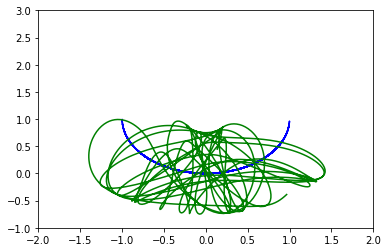

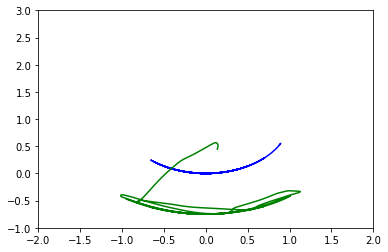

Iteration 0433 | Total Loss 0.639992
Iteration 0434 | Total Loss 0.746088


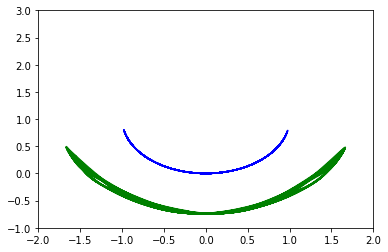

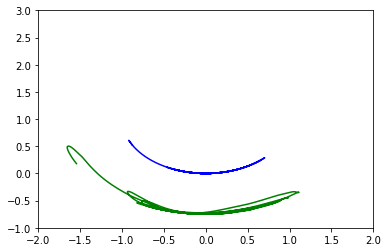

Iteration 0435 | Total Loss 0.728092
Iteration 0436 | Total Loss 0.912560


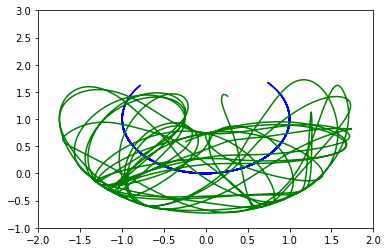

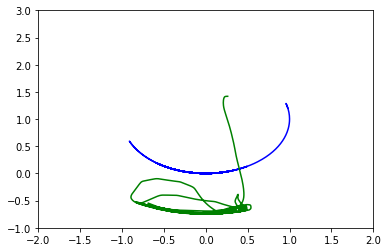

Iteration 0437 | Total Loss 0.809081
Iteration 0438 | Total Loss 1.010268


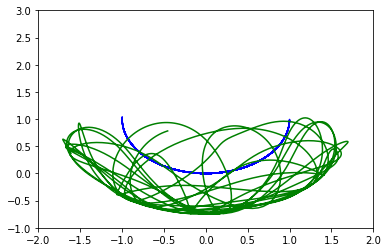

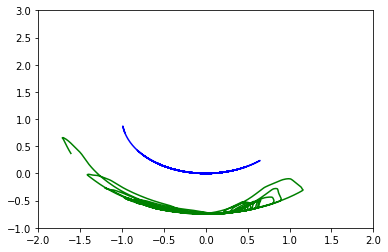

Iteration 0439 | Total Loss 0.809878
Iteration 0440 | Total Loss 0.941660


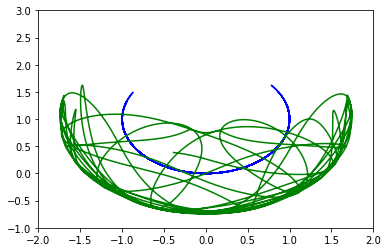

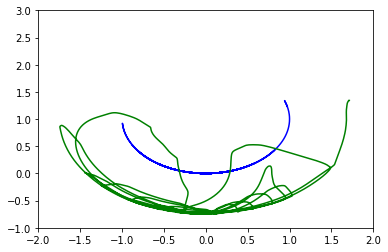

Iteration 0441 | Total Loss 0.726437
Iteration 0442 | Total Loss 0.785134


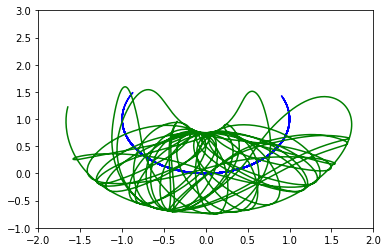

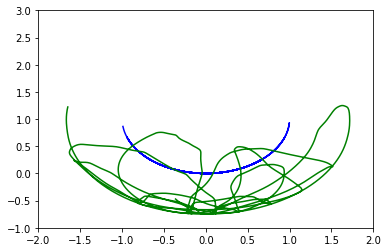

Iteration 0443 | Total Loss 0.635493
Iteration 0444 | Total Loss 0.666566


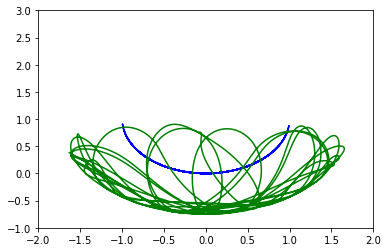

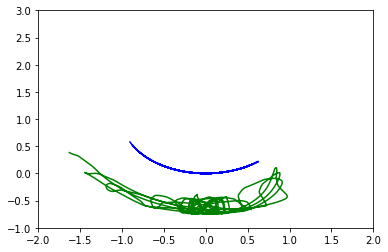

Iteration 0445 | Total Loss 0.581807
Iteration 0446 | Total Loss 0.613679


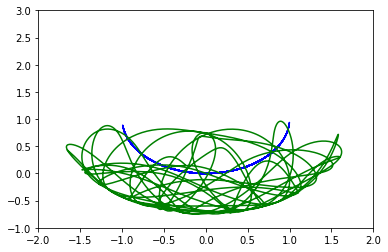

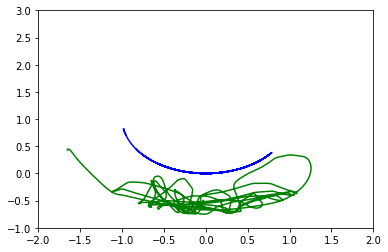

Iteration 0447 | Total Loss 0.564123
Iteration 0448 | Total Loss 0.607041


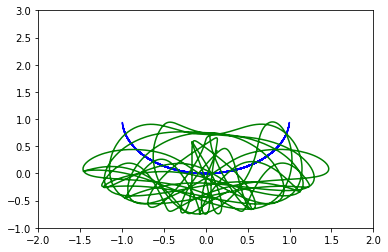

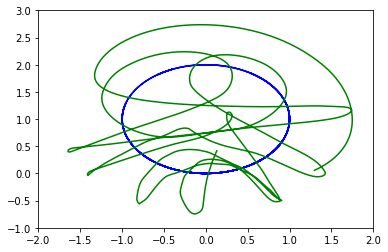

Iteration 0449 | Total Loss 0.574431
Iteration 0450 | Total Loss 0.635067


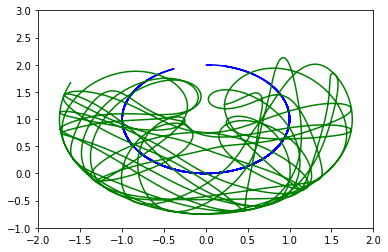

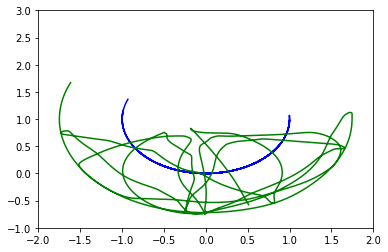

Iteration 0451 | Total Loss 0.608552
Iteration 0452 | Total Loss 0.691989


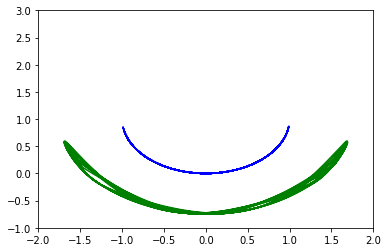

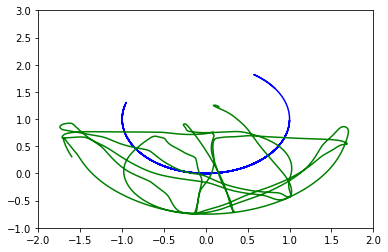

Iteration 0453 | Total Loss 0.661476
Iteration 0454 | Total Loss 0.767405


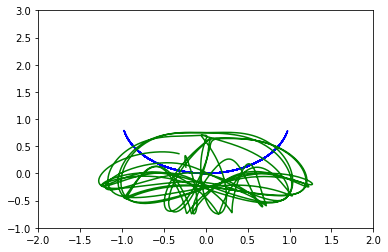

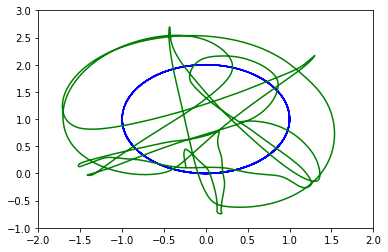

Iteration 0455 | Total Loss 0.722868
Iteration 0456 | Total Loss 0.844823


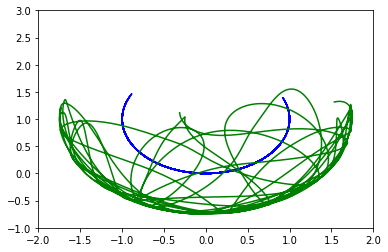

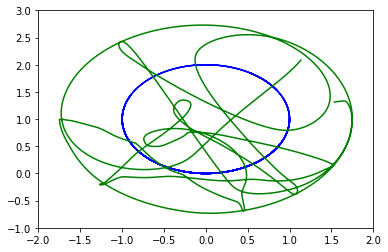

Iteration 0457 | Total Loss 0.787936
Iteration 0458 | Total Loss 0.938077


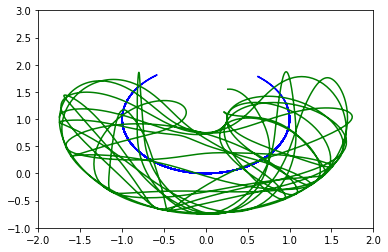

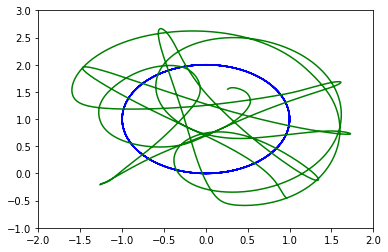

Iteration 0459 | Total Loss 0.929630
Iteration 0460 | Total Loss 1.241364


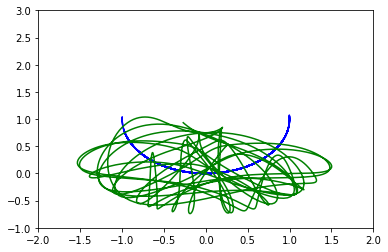

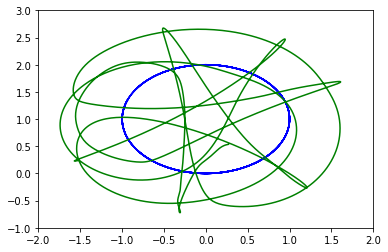

Iteration 0461 | Total Loss 1.401874
Iteration 0462 | Total Loss 1.773129


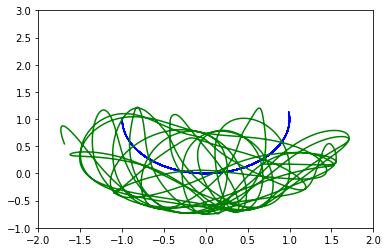

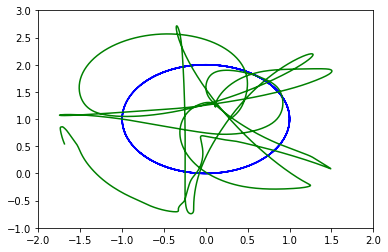

Iteration 0463 | Total Loss 1.522965
Iteration 0464 | Total Loss 1.508360


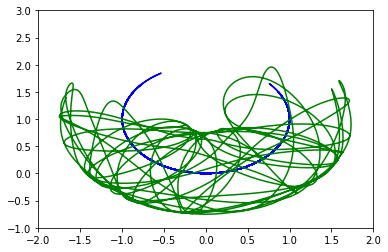

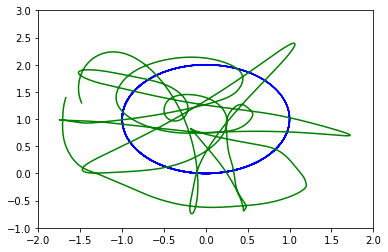

Iteration 0465 | Total Loss 1.164939
Iteration 0466 | Total Loss 0.967765


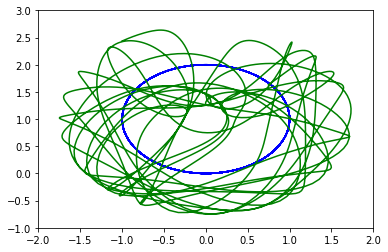

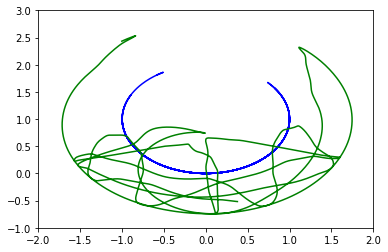

Iteration 0467 | Total Loss 0.739248
Iteration 0468 | Total Loss 0.651421


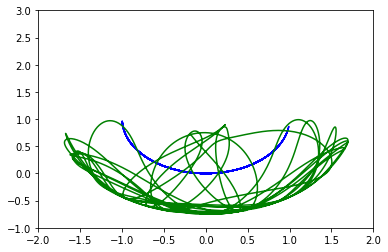

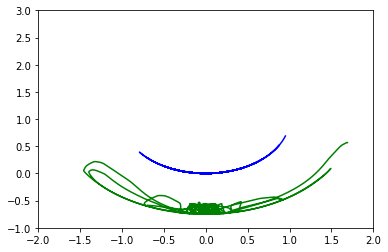

Iteration 0469 | Total Loss 0.545765
Iteration 0470 | Total Loss 0.525702


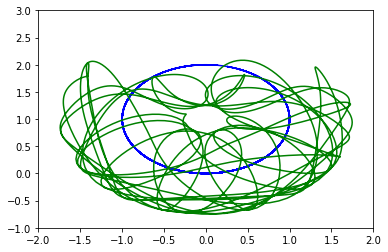

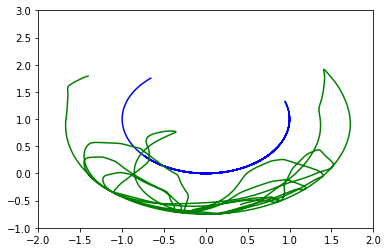

Iteration 0471 | Total Loss 0.486909
Iteration 0472 | Total Loss 0.493797


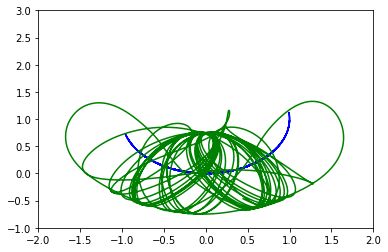

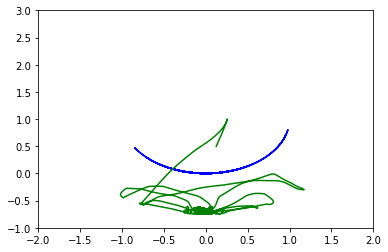

KeyboardInterrupt: 

In [18]:
if __name__ == '__main__':
    
    #ii = 0
    X = torch.linspace(-2,2,10)
    
    func = ODEFunc()
    optimizer = optim.RMSprop(func.parameters())          #this is an optimizer designed to update parameters
    end = time.time()                                     #usually people use SGD but this is a mini-batch approach
                                                          #http://www.cs.toronto.edu/~tijmen/csc321/slides/lecture_slides_lec6.pdf
    #RunningAvgMeter Objects
    time_meter = RunningAverageMeter(0.97)
    loss_meter = RunningAverageMeter(0.97)
    
    #TRAINING
    for itr in range(1, niters+1):
        #initial conditions; requires 2D tensor
        true_y0 = torch.tensor([[random(), random(), random(), random()]])
        
        with torch.no_grad(): #no_grad disables gradient finding when true_y is defined
            #print(torch.mm(true_y0**3,true_A))
            true_y = odeint(Lambda(),true_y0, t, method='adams') 
            #true_y is the solved ODE defined in Lambda
            #odeint only takes a function from nn.Module >> implications? see solver comparision Jupyter
            #it uses Lambda to provide the function to go solve the IVP given true_y0 with the ODE solver on t
            trueSl = getSlopesTorch(X.numpy(),Lambda())
        
        optimizer.zero_grad() #set gradients to zero/ not computed
        
        #batch_y0, batch_t, batch_y = get_batch()
        #feeds odeint the ODEBlock, a set of y values based on random t values and the first ten values of t
        #pred_y = odeint(func, batch_y0, batch_t)
        #deviates from usual Loss of mean squared difference but sum in both cases is positive
        #print(pred_y.detach(),batch_y)
        #---------------------------------------
        predSl = getSlopesTorch(X.numpy(),func)
        
        #loss = torch.mean(torch.abs(pred_y-batch_y)**2) #ask Ivan about predY-bY, also this returns a number
        #--------------------------------------------------
        loss = torch.mean(torch.abs(predSl-trueSl)**2)
        
        loss.backward() #backpropogation
        optimizer.step() #gradient descent and update parameters
        #Update time and loss meters
        time_meter.update(time.time()-end) #takes in time difference to establish velocity see RMS method details
        loss_meter.update(loss.item()) #the loss itself is a delta / change
        
        with torch.no_grad():
            
            #loss = torch.mean(torch.abs(pred_y-true_y)**2)
            #-------------------------------------------------
            predSl = getSlopesTorch(X.numpy(),func)
            
            loss = torch.mean(torch.abs(predSl-trueSl)**2)
            print('Iteration {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
        
            if itr % test_freq == 0:
                pred_y = odeint(func, true_y0, t, method='adams')
                visualize(true_y)
                visualize(pred_y)
                
        #torch.save(func.state_dict(), C:\Users\delis\Desktop\DEPython\modelP)
                
        end = time.time()